# Local Crystallography analysis of Mo<sub>1-x</sub>Re<sub>x</sub>S<sub>2</sub>

## Notebook by R. Vasudevan
## June 12 2019

Here we analyze the data in the image series of Mo<sub>1-x</sub>Re<sub>x</sub>S<sub>2</sub> from STEM images

# Load and import libraries and necessary functions

In [1]:
#Let's make sure scikit-image is loaded

!pip install scikit-image pyUSID

    100% |████████████████████████████████| 143kB 7.4MB/s ta 0:00:01
    100% |████████████████████████████████| 286kB 14.7MB/s ta 0:00:01


tables 3.5.1 requires mock>=2.0, which is not installed.
distributed 1.26.1 requires msgpack, which is not installed.
keras 2.2.2 has requirement keras_applications==1.0.4, but you'll have keras-applications 1.0.2 which is incompatible.
keras 2.2.2 has requirement keras_preprocessing==1.0.2, but you'll have keras-preprocessing 1.0.1 which is incompatible.
You are using pip version 10.0.1, however version 19.1.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


First we need to get the data as well as download Maxim's atomNet for finding atoms. 

In [2]:
%%shell
#This is the data
gdown https://drive.google.com/uc?id=1TE14N2mNn8_43GgKOcci_1cbRxwWJ0Pv

#Unzip it
unzip data_and_funcs.zip

#This is the link to pycroscopy AI Crystallographer repository where the AtomNet lives
git clone https://github.com/pycroscopy/AICrystallographer.git
cp -r AICrystallographer/AtomNet/* .

UsageError: Cell magic `%%shell` not found.


Import the packages necessary

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import dcnn
from atomfind import *
from helper_funcs import *
from skimage.color import rgb2gray
from skimage.io import imread

ModuleNotFoundError: No module named 'dcnn'

# Helper Functions

In [4]:
def do_NN_analysis(atom_pos_all, atom_pos_cen, nn_index, num_neighbors=6):
    num_atoms = atom_pos_all.shape[0]
    d_vec = np.zeros((1,num_neighbors),dtype=float)
    a_vec = d_vec.copy()
    xd_vec = d_vec.copy()
    yd_vec = d_vec.copy()
    d_mat = np.zeros((num_atoms,num_neighbors),dtype=float)
    a_mat = d_mat.copy()
    xd_mat = d_mat.copy()
    yd_mat = d_mat.copy()
    atom_neighbor_pos = np.zeros((num_atoms,num_neighbors,2))

    #build a matrix of measurements from each atom to its nearest neighbors
    for k1 in range(0,num_atoms-1):
        x0 = atom_pos_cen[k1,0]
        y0 = atom_pos_cen[k1,1]
        if ((int(x0==0)+int(y0==0))==0):
            for k2 in range(0,num_neighbors):            
                x1 = atom_pos_all[nn_index[k1,k2],0]
                y1 = atom_pos_all[nn_index[k1,k2],1]
                d_vec[0,k2] = np.abs((x0-x1)+1j*(y0-y1)) #array of distances from each atom to its nearest neighbors
                a_vec[0,k2] = np.angle((x0-x1)+1j*(y0-y1)) #array of angles from each atom to its nearest neighbors
                xd_vec[0,k2] = (x0-x1)
                yd_vec[0,k2] = (y0-y1)
                atom_neighbor_pos[k1,k2,:] =[x1,y1] 

            # sort neighbors based on angle
            sort_ind = np.argsort(a_vec[0,:],axis=None)
            d_mat[k1,:] = d_vec[0,sort_ind]
            a_mat[k1,:] = a_vec[0,sort_ind]
            xd_mat[k1,:] = xd_vec[0,sort_ind]
            yd_mat[k1,:] = yd_vec[0,sort_ind]

    return d_mat, a_mat, xd_mat, yd_mat, atom_neighbor_pos

def do_NN_analysis_ind(atom_pos_all, dopant_atoms, dopant_atom_id, nn_index, num_neighbors=6):
    
    num_atoms = dopant_atoms.shape[0]
    d_vec = np.zeros((1,num_neighbors),dtype=float)
    a_vec = d_vec.copy()
    xd_vec = d_vec.copy()
    yd_vec = d_vec.copy()
    d_mat = np.zeros((num_atoms,num_neighbors),dtype=float)
    a_mat = d_mat.copy()
    xd_mat = d_mat.copy()
    yd_mat = d_mat.copy()
    atom_neighbor_pos = np.zeros((num_atoms,num_neighbors,2))

    #build a matrix of measurements from each atom to its nearest neighbors
    #Only consider teh atoms that are in the subset we want ie Mo or Re

    for k1 in range(0,num_atoms-1):
        x0 = dopant_atoms[k1,0]
        y0 = dopant_atoms[k1,1]
        if ((int(x0==0)+int(y0==0))==0):
            for k2 in range(0,num_neighbors):
                xid = dopant_atom_id[k1]
                x1 = atom_pos_all[nn_index[xid,k2],0]
                y1 = atom_pos_all[nn_index[xid,k2],1]
                d_vec[0,k2] = np.abs((x0-x1)+1j*(y0-y1)) #array of distances from each atom to its nearest neighbors
                a_vec[0,k2] = np.angle((x0-x1)+1j*(y0-y1)) #array of angles from each atom to its nearest neighbors
                xd_vec[0,k2] = (x0-x1)
                yd_vec[0,k2] = (y0-y1)
                atom_neighbor_pos[k1,k2,:] =[x1,y1] 

            # sort neighbors based on angle
            sort_ind = np.argsort(a_vec[0,:],axis=None)
            d_mat[k1,:] = d_vec[0,sort_ind]
            a_mat[k1,:] = a_vec[0,sort_ind]
            xd_mat[k1,:] = xd_vec[0,sort_ind]
            yd_mat[k1,:] = yd_vec[0,sort_ind]
            
    return d_mat, a_mat, xd_mat, yd_mat, atom_neighbor_pos

def do_plot_kmeans_results(xd_mat2, yd_mat2, dopant_atoms, cropped_image, num_clusters = 4):
    
    zd_mat2 = np.zeros(shape=(xd_mat2.shape[0]-1, xd_mat2.shape[1],2))
    zd_mat2[:,:,0] = xd_mat2[:-1,:]
    zd_mat2[:,:,1] = yd_mat2[:-1,:]
    zd_mat2 = zd_mat2.reshape(xd_mat2.shape[0]-1, -1)
    
    km = KMeans(n_clusters = num_clusters)
    km.fit(zd_mat2)
    cluster_centroids = km.cluster_centers_
    labels=km.labels_
    #print(labels.shape)
    #print(cluster_centroids.shape)
    my_colors = ['r', 'b', 'c', 'k', 'g', 'y', 'gray', 'm', '#eeefff',
                '#eeefff', '#eeefff', '#eeefff', '#eeefff','#eeefff']

    fig, axes = plt.subplots(figsize =(10,10))
    axes.imshow(cropped_image)
    axes.set_title('KMeans Labels', fontsize = 18)
    for i in range(min(len(dopant_atoms),len(labels))):
        x,y = dopant_atoms[i]
        axes.scatter(y,x,c = my_colors[labels[i]])
    
    if num_clusters <=4:
      fig, axes = plt.subplots(nrows=2, ncols=2, figsize = (4,4))
    elif num_clusters>4 and num_clusters<=6:
      fig, axes = plt.subplots(nrows=2, ncols=3, figsize = (6,4))
    elif num_clusters>6:
      fig, axes = plt.subplots(nrows=3, ncols=3, figsize = (8,8))
      
    for ind, ax in enumerate(axes.flat):
      if ind< num_clusters:
          pt = cluster_centroids[ind,:]
          xpts = pt[::2]
          ypts = pt[1::2]
          my_color = my_colors[ind]
          ax.scatter(xpts, ypts, s=50, c = my_color)
          ax.scatter(0,0,c='b', s = 40)
          #ax.axis('equal')
          ax.set_xlim(-100,100)
          ax.set_ylim(-100,100)
          #ax.set_xticklabels([-50, -25, 0, 25, 50], fontsize = 14)
          #ax.set_yticklabels([-50, -25, 0, 25, 50], fontsize = 14)
          ax.set_title('Cluster {}'.format(ind), fontsize = 14)
    fig.tight_layout()
    
    return cluster_centroids, labels

def do_plot_pca_results(d_mat2, a_mat2, xd_mat2, yd_mat2, raw_image, atom_pos_2, border = 2):

    plt.figure(figsize=(8,8))
    plt.scatter(xd_mat2,yd_mat2,c='k',s=2)
    plt.axis('equal')

    [ud,sd,vd] = np.linalg.svd(d_mat2,full_matrices=0) #SVD on radial distance of nearest neighbors
    [ua,sa,va] = np.linalg.svd(a_mat2,full_matrices=0) #SVD on anglular displacement of nearest neighbors

    [us,ss,vs] = np.linalg.svd(xd_mat2+1j*yd_mat2,full_matrices=0) #SVD on relative position of nearest neighbors (complex valued)

    #convert complex results of 
    usm = np.abs(us)
    usa = np.angle(us)
    usx = np.real(us)
    usy = np.imag(us)

    vsm = np.abs(vs)
    vsa = np.angle(vs)
    vsx = np.real(vs)
    vsy = np.imag(vs)

    # plot eigenvalue radial displacements
    fig, axs = plt.subplots(2,3, figsize=(12, 8), facecolor='black', edgecolor='w')
    fig.subplots_adjust(hspace = .1, wspace=.1)
    axs = axs.ravel()
    for k1 in range(0,min(6,ud.shape[-1])):
        up = ud[:,k1]
        up = up-up.min()
        up = up/up.max()
        colors = plt.cm.bwr(up)
        axs[k1].imshow(1-raw_image, cmap='Greys', interpolation='none',alpha=1)
        axs[k1].scatter(atom_pos_2[:,1]+border,atom_pos_2[:,0]+border,c=colors,s=8)

    # plot eigenvector maps of radial displacement eigenvectors
    fig, axs = plt.subplots(2,3, figsize=(12, 8))
    fig.subplots_adjust(hspace = .2, wspace=.2)
    axs = axs.ravel()
    for k1 in range(0,min(6,vd.shape[0])):
        axs[k1].plot(0,0,'bo')
        axs[k1].plot(vsx[0,:],vsy[0,:],'ro')
        #axs[k1].axis('off')    
        axs[k1].axis('equal')
        c = 1.0
        axs[k1].axis([-c, c, -c, c])
        axs[k1].set_title(str(k1))
        axs[k1].quiver(vsx[0,:],vsy[0,:],vsx[0,:]*vd[k1,:],vsy[0,:]*vd[k1,:])

    return 

def rotatation_augmentation(xd_mat, yd_mat, rotation_angle = 120):
  #returns original plus augmented list of (x,y) pairs
  #angle in degrees
  #Choose a pixel (atom index)
  xd_mat_rotated = np.zeros(shape=xd_mat.shape)
  yd_mat_rotated  = np.zeros(shape=yd_mat.shape) 
  for i in range(xd_mat.shape[0]):

    rotation_angle_rad = rotation_angle/180 * np.pi

    R_mat = np.array([[np.cos(rotation_angle_rad), -np.sin(rotation_angle_rad)],
                      [np.sin(rotation_angle_rad), np.cos(rotation_angle_rad)]])

    #Stack them
    xy_mat = np.vstack((xd_mat2[i,:], yd_mat2[i,:])).T

    #Apply a rotation
    xy_mat_rotated = np.matmul(xy_mat,R_mat)
    
    #Save
    xd_mat_rotated[i,:] = xy_mat[:,0]
    yd_mat_rotated[i,:] = xy_mat[:,1]
   
  return xd_mat_rotated, yd_mat_rotated
    

def return_shell_matrices(good_points_shell, d_mat2, a_mat2, xd_mat2, yd_mat2, 
                          dopant_atoms2, nn=6):
  #given a list of good points and pixel indices, construct the reduced point cloud statistics matrices
  d_mat_shell = np.zeros(shape=(good_points_shell.shape[0],nn))
  a_mat_shell = np.zeros(shape=(good_points_shell1.shape[0],nn))
  xd_mat_shell = np.zeros(shape=(good_points_shell.shape[0],nn))
  yd_mat_shell = np.zeros(shape=(good_points_shell.shape[0],nn))
  dopant_atoms_shell = np.zeros(shape=(good_points_shell.shape[0],2))
  #Populate  shell
  for i in range(good_points_shell.shape[0]):
    d_mat_shell[i,:] = d_mat2[good_points_shell[i,0], good_points_shell[i,1]]
    a_mat_shell[i,:] = a_mat2[good_points_shell[i,0], good_points_shell[i,1]]
    xd_mat_shell[i,:] = xd_mat2[good_points_shell[i,0], good_points_shell[i,1]]
    yd_mat_shell[i,:] = yd_mat2[good_points_shell[i,0], good_points_shell[i,1]]

    #order based on angle
    angle_order = np.argsort(a_mat_shell[i,:])
    d_mat_shell[i,:] = d_mat_shell[i,angle_order]
    a_mat_shell[i,:] = a_mat_shell[i,angle_order]
    xd_mat_shell[i,:] = xd_mat_shell[i,angle_order]
    yd_mat_shell[i,:] = yd_mat_shell[i,angle_order]
    dopant_atoms_shell[i,:] = dopant_atoms2[i,:]

  return d_mat_shell, a_mat_shell, xd_mat_shell, yd_mat_shell, dopant_atoms_shell

def return_neighbor_type(atom_neighbor_pos, atom_pos_all, Mo_atom_id, dopant_atom_id):

  nn_type = np.zeros(shape=(atom_neighbor_pos.shape[0], atom_neighbor_pos.shape[1])) #0 for Mo, 1 for Re

  for i in range(atom_neighbor_pos.shape[0]-1):
    for j in range(atom_neighbor_pos.shape[1]):
      indx, indy = np.where(atom_neighbor_pos[i,j,:]==atom_pos_all)
      if len(indx)!=0:
        #This means the atom was found. Good!
        #Now find out what type of atom was found
        if indx[1] in Mo_atom_id: nn_type[i,j] = 0
        elif indx[1] in dopant_atom_id: nn_type[i,j] = 1
      
  return nn_type

Load the pre-trained AtomNet model so we can use it for atom finding

In [0]:
foldername = './saved_models/'
filename = 'G-Si-DFT0-1-4-best_weights.pt'

model = dcnn.atomsegnet()
model = dcnn.load_torchmodel(foldername+filename, model)

Now load the first image and find atoms

# Mo<sub>0.95</sub>Re<sub>0.05</sub> Atomic Coordinate Extraction

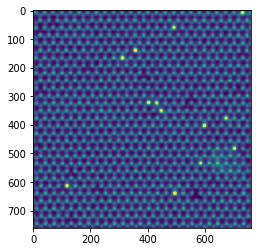

In [0]:
img = imread('re05.tiff')
re05 = rgb2gray(img)
plt.figure()
plt.imshow(re05)

Use AtomNet to find atomic positions

1 image was decoded in approximately 5.12 seconds
Atomic/defect coordinates extracted


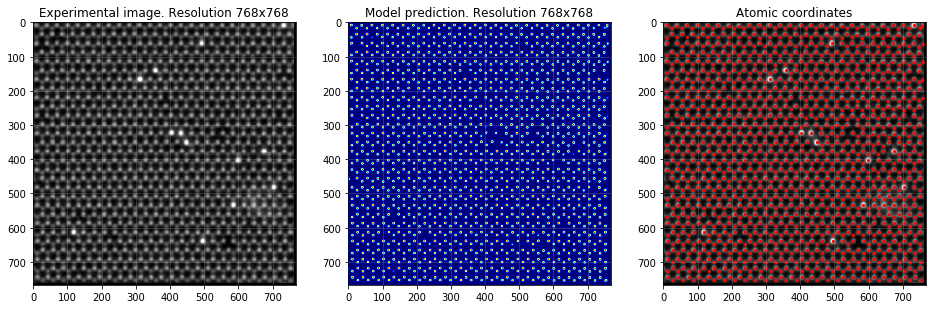

In [0]:
# Load experimental data as 2-d numpy array
imgdata = re05
#print('Test image name:', k)
# Make a prediction using a loaded DL model
img, dec = dl_image(imgdata, model).decode()
# Exract atomic coordinates from the neural network output
coord = find_atoms(dec).get_all_coordinates()
# Plot results
fig, ax = plt.subplots(1, 3, figsize=(16, 10))
ax[0].imshow(img[0, :, :, 0], cmap='gray')
ax[0].set_title('Experimental image. Resolution '+str(img.shape[1])+'x'+str(img.shape[2]))
ax[1].imshow(dec[0, :, :, 0], cmap='jet', Interpolation ='Gaussian')
ax[1].set_title('Model prediction. Resolution '+str(dec.shape[1])+'x'+str(dec.shape[2]))
ax[2].imshow(img[0, :, :, 0], cmap='gray')
ax[2].scatter(coord[0][:, 1], coord[0][:, 0], s=5, c='red')
ax[2].set_title('Atomic coordinates')
for _ax in fig.axes:
    _ax.grid(alpha=0.3)
plt.show()

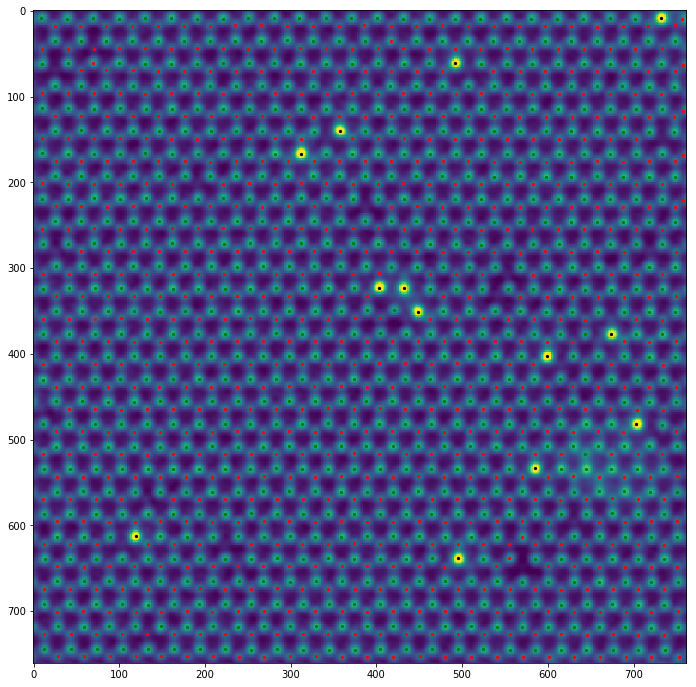

In [0]:
#This gives us the S atoms in additon to the Mo and Re atoms. 
#We wish to isolate them, so we are going to try a simple threshold
#Same goes for classifying Re vs Mo atoms

plt.figure(10, figsize = (12,12));
plt.imshow(re05);

Mo_atoms = []
Re_atoms = []

for i in range(len(coord[0])):
  atom_x = coord[0][i,0]
  atom_y = coord[0][i,1]
  mean_int = re05[int(atom_x)-2:int(atom_x)+2, int(atom_y)-2:int(atom_y)+2].mean()
  if  mean_int <0.51:
    plt.scatter(atom_y, atom_x, color = 'r', s = 5)
    
  elif mean_int>=0.51 and mean_int<=0.90:
    plt.scatter(atom_y, atom_x, color = 'g', s = 5)
    Mo_atoms.append([atom_x, atom_y])
  else:
    plt.scatter(atom_y, atom_x, color = 'k', s = 5)
    Re_atoms.append([atom_x, atom_y])

In [0]:
#Now let's save those into a dictionary of image + coordinates

Re05 = {'Image': re05, 'Mo_atoms': Mo_atoms, 'Re_atoms': Re_atoms }
MoReDict = {'Re05':Re05}


# Mo<sub>0.95</sub>Re<sub>0.05</sub> Local crystallographic analysis

Calculating Results for Mo atom neighborhood only
Calculating Results for Re atom neighborhood only


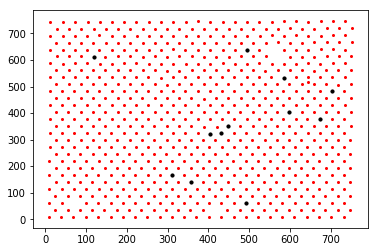

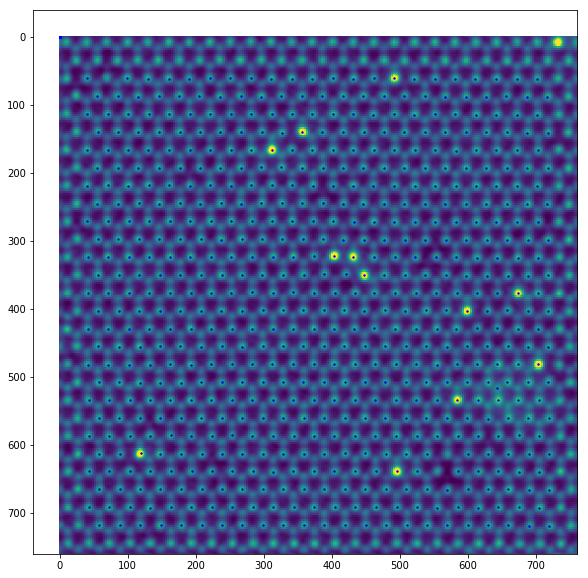

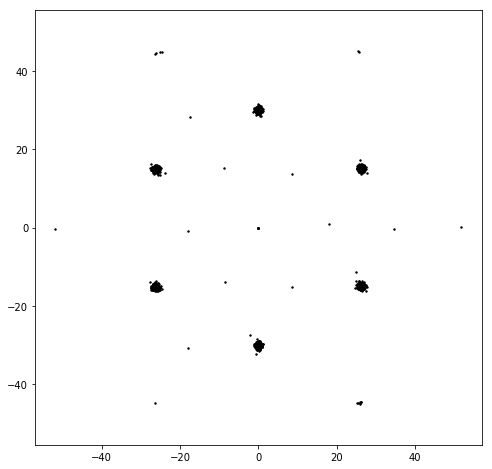

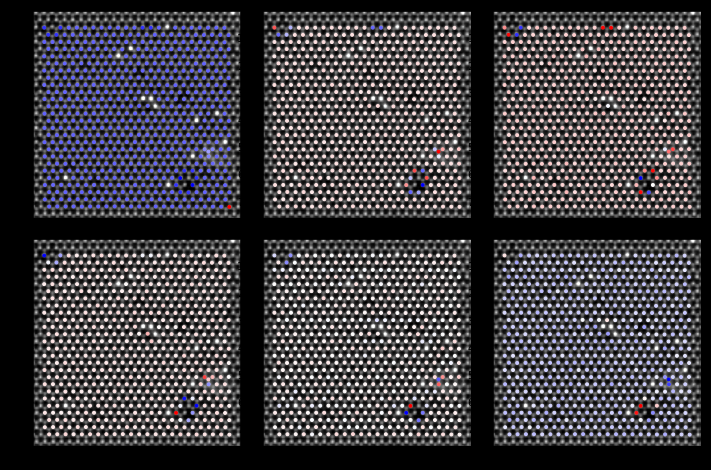

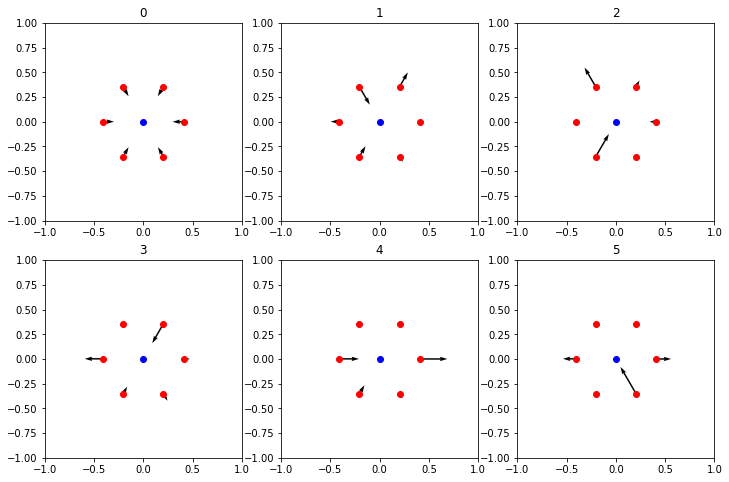

...

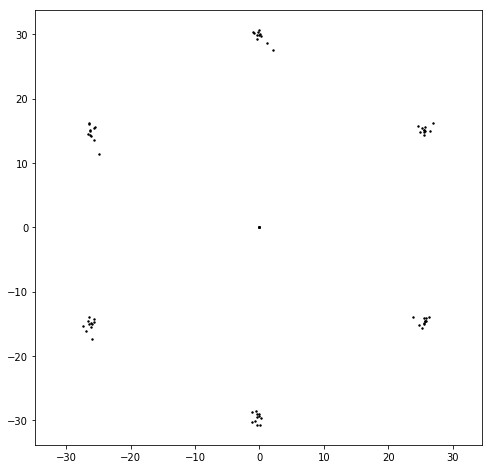

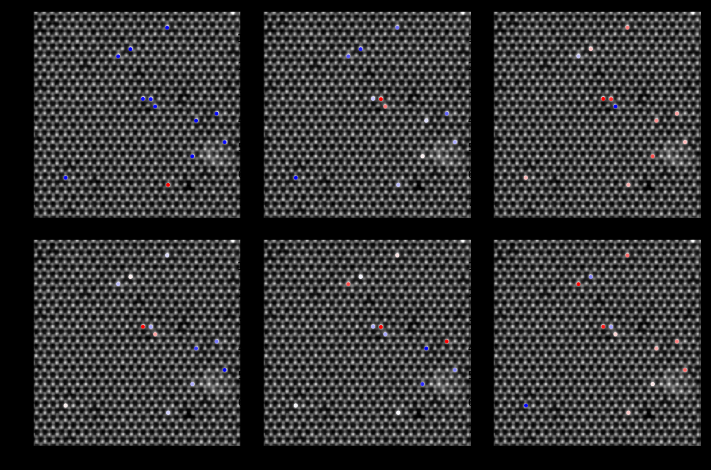

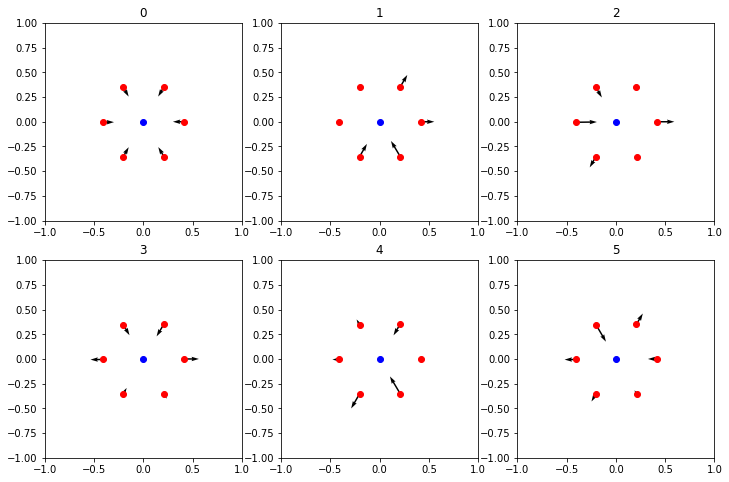

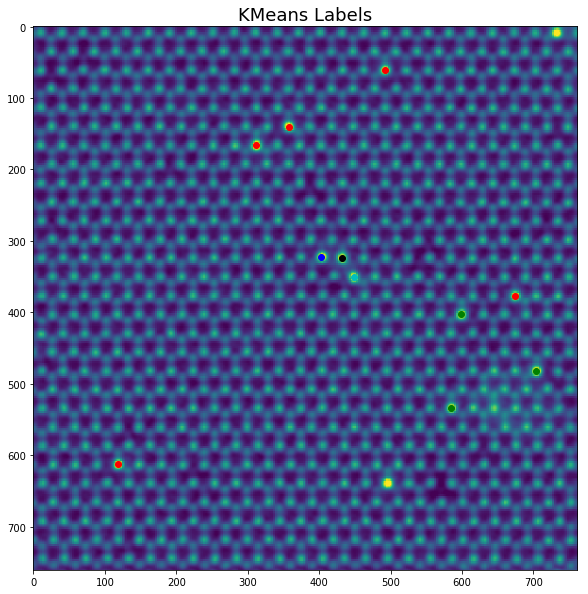

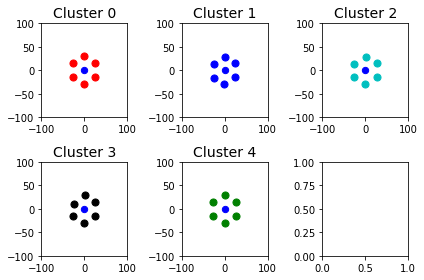

In [0]:
#TODO: Adjust helper_funcs so the plots have appropriate axes, titles, etc.

border = 40 #border pixels
num_neighbors = 6 #number of NN to analyze
num_clusters = 5 #Number of kmeans clusters
threshold_val = 0.80


#Look at re05 first
atom_centroids_1 = np.array(Re05['Mo_atoms'])
atom_centroids_2 =  np.array(Re05['Re_atoms'])
cropped_image = Re05['Image'][:]

raw_image = cropped_image

image_size_x = raw_image.shape[0]
image_size_y = raw_image.shape[1]

atom_positions = np.vstack((atom_centroids_1, atom_centroids_2))

# Edge Atom Eliminator for k-means algorithm 
x_y_positions_edge_cut = edge_eliminator(raw_image, atom_positions, border_pixels=border)

all_x = x_y_positions_edge_cut[:,0]
all_y = x_y_positions_edge_cut[:,1]

nbrs = NearestNeighbors(n_neighbors=num_neighbors+1, algorithm='brute').fit(atom_positions)
distance_vec, full_index = nbrs.kneighbors(atom_positions)

nn_index = full_index[:,1:]

# rename for convenience
atom_pos_cen = x_y_positions_edge_cut;
atom_pos_all = atom_positions;
        
Mo_atoms, Mo_atom_id, dopant_atoms, dopant_atom_id = \
threshold_and_border_correction(atom_pos_all, border_pixels=border,
                                threshold_val = threshold_val, cropped_image=cropped_image);

plt.figure(10, figsize = (10,10))
plt.imshow(raw_image)
for i in range(atom_pos_all.shape[0]):
    re_x = atom_pos_cen[i,0]
    re_y = atom_pos_cen[i,1]
    plt.scatter(re_y, re_x, s=2, c = 'b')

choices = ['Mo', 'Re']


local_cryst_results = {}

for choice in choices:

    if choice=='Mo':
        dopant_atoms2 = Mo_atoms.copy()
        dopant_atoms2_id = Mo_atom_id.copy()
        print('Calculating Results for Mo atom neighborhood only')
    else:
        print('Calculating Results for Re atom neighborhood only')
        dopant_atoms2 = dopant_atoms.copy()
        dopant_atoms2_id = dopant_atom_id.copy()

    d_mat, a_mat, xd_mat, yd_mat, atom_neighbor_pos = do_NN_analysis_ind(atom_pos_all,
                                                                         dopant_atoms2, dopant_atoms2_id, nn_index,
                                                                         num_neighbors)

    #Get the type of neighbor atoms - 0 for Mo, 1 for Re
    nn_type = return_neighbor_type(atom_neighbor_pos, atom_pos_all, Mo_atom_id, dopant_atom_id)

    # remove border atoms from the list of atoms
    #d_mat2, a_mat2, xd_mat2, yd_mat2, atom_pos_2 = remove_border_atoms(dopant_atoms2, d_mat, a_mat, xd_mat, yd_mat,)

    # plot neighborhood point cloud and perform PCA
    do_plot_pca_results(d_mat, a_mat, xd_mat, yd_mat, raw_image, dopant_atoms2, border =0)
    
    #do kmeans of point clouds
    cluster_centroids, labels = do_plot_kmeans_results(xd_mat, yd_mat, 
                                 dopant_atoms2, cropped_image, num_clusters = num_clusters)
    
    local_cryst_results[choice] = [d_mat, a_mat, xd_mat, yd_mat, dopant_atoms2, nn_type]
    
Re05['local_crystallography'] = local_cryst_results

# Mo<sub>0.45</sub>Re<sub>0.55</sub> Atomic Coordinate Extraction

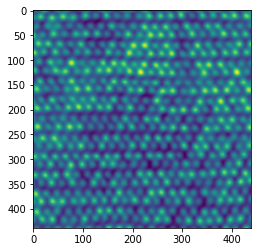

In [0]:
img = np.load('re55_cropped_image.npy')
re55 = rgb2gray(img)
plt.figure()
plt.imshow(re55)

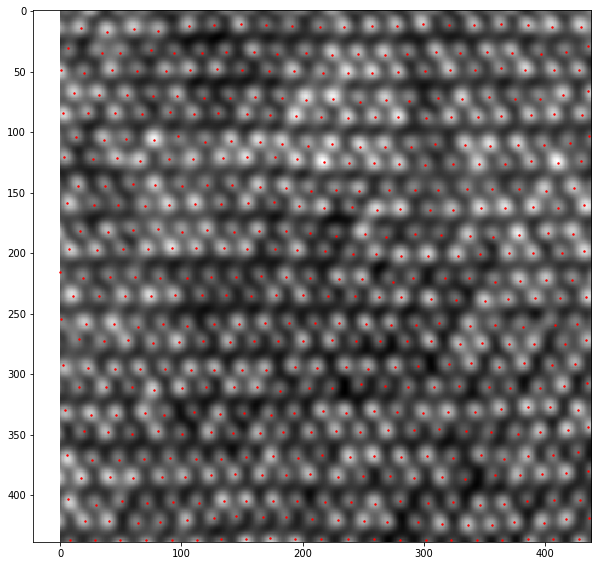

In [0]:
# Load experimental data as 2-d numpy array and load in atomic coordinates
# The AtomNet won't work on these images due to the different symmetry (something for Maxim to work on...)

atom_positions = np.load('re55_atom_positions_refined.npy')

plt.figure(figsize = (10,10))
plt.imshow(re55, cmap = 'gray')
plt.scatter(atom_positions[:,1], atom_positions[:,0], s=2, c = 'red')


# Mo<sub>0.45</sub>Re<sub>0.55</sub> Local Crystallography Analysis 

Calculating Results for Mo atom neighborhood only
Calculating Results for Re atom neighborhood only


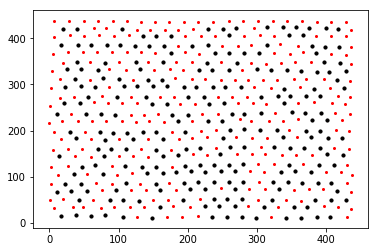

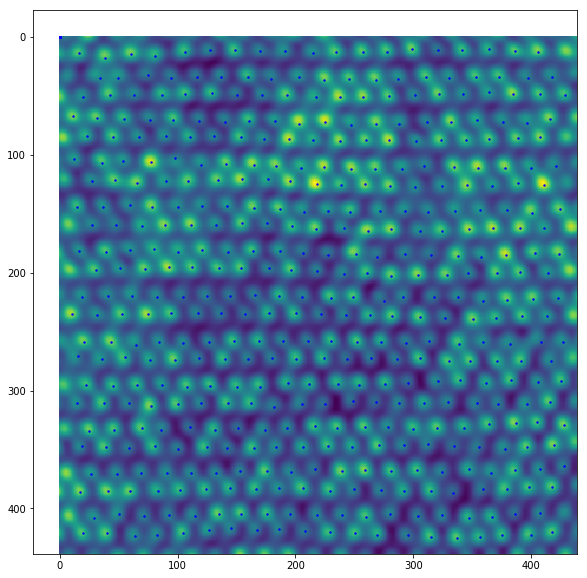

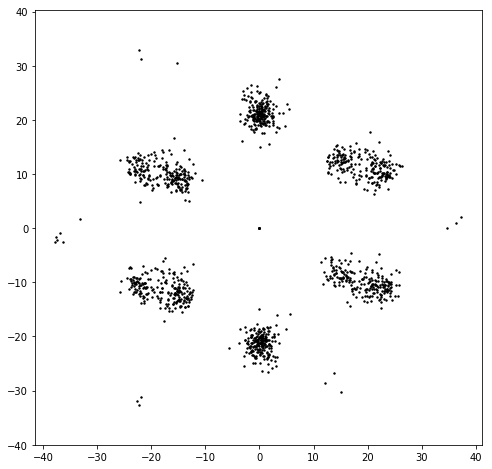

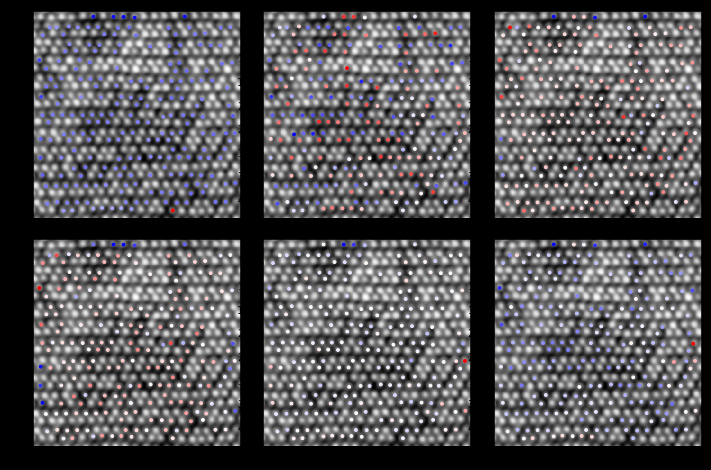

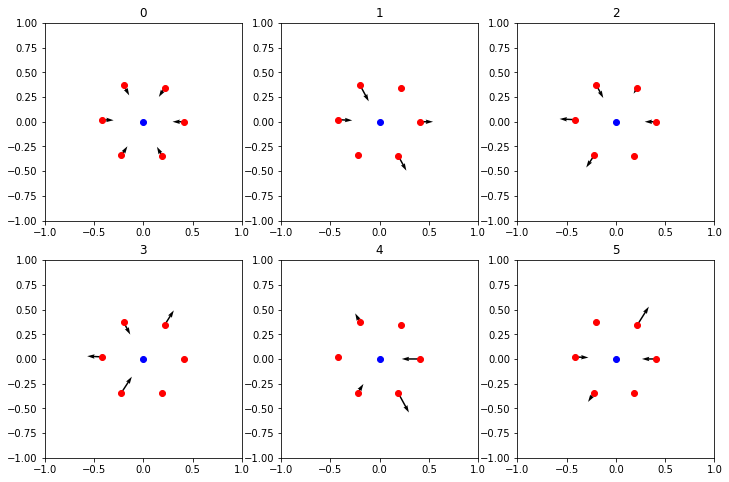

...

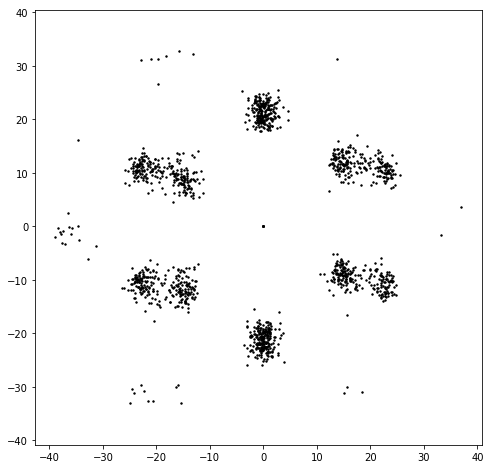

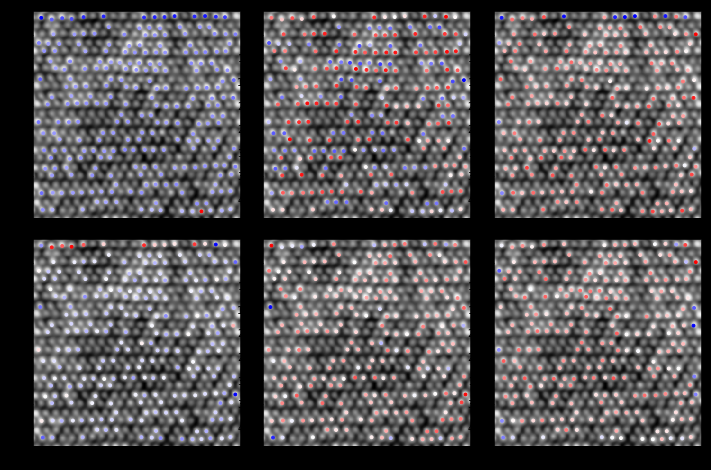

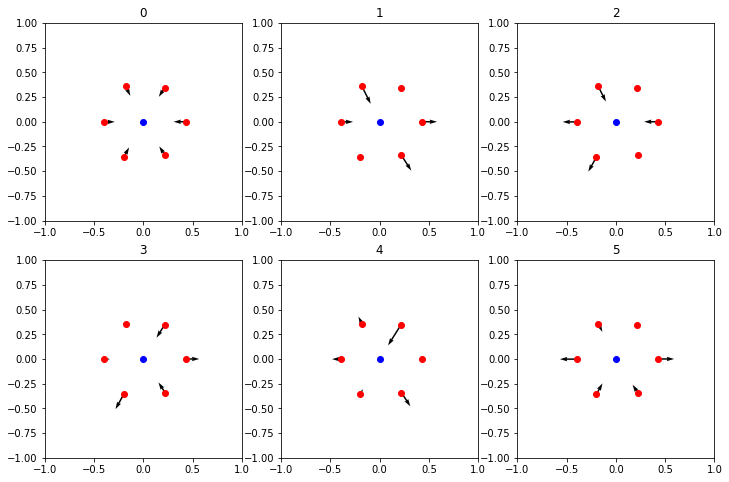

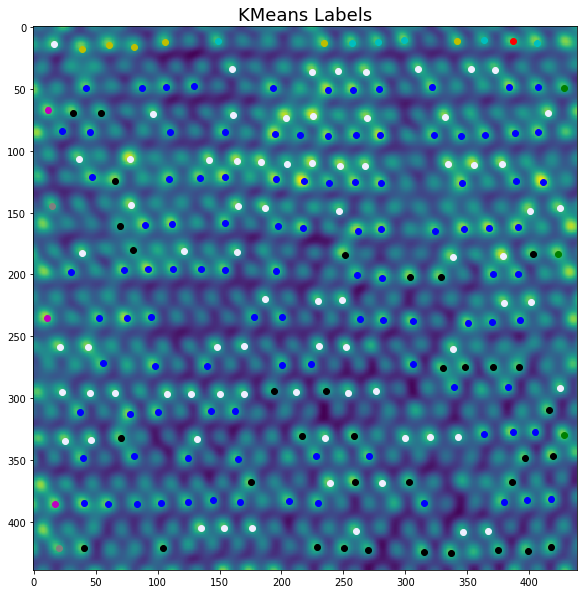

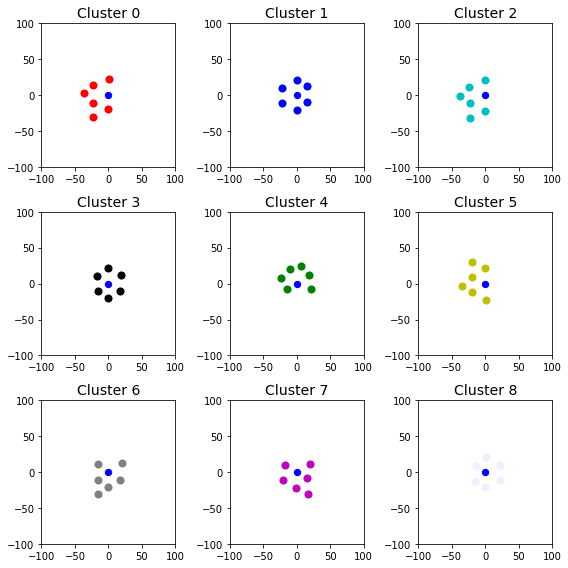

In [0]:
#TODO: Adjust helper_funcs so the plots have appropriate axes, titles, etc.

border = 10 #border pixels
num_neighbors = 6 #number of NN to analyze
num_clusters = 11 #Number of kmeans clusters

threshold_val = 0.60

cropped_image = (re55 - np.min(re55)) / (np.max(re55) - np.min(re55))

raw_image = cropped_image

image_size_x = raw_image.shape[0]
image_size_y = raw_image.shape[1]

#atom_positions = np.vstack((atom_centroids_1, atom_centroids_2))

# Edge Atom Eliminator for k-means algorithm 
x_y_positions_edge_cut = edge_eliminator(raw_image, atom_positions, border_pixels=border)

all_x = x_y_positions_edge_cut[:,0]
all_y = x_y_positions_edge_cut[:,1]

nbrs = NearestNeighbors(n_neighbors=num_neighbors+1, algorithm='brute').fit(atom_positions)
distance_vec, full_index = nbrs.kneighbors(atom_positions)

nn_index = full_index[:,1:]

# rename for convenience
atom_pos_cen = x_y_positions_edge_cut;
atom_pos_all = atom_positions;
        
Mo_atoms, Mo_atom_id, dopant_atoms, dopant_atom_id = \
threshold_and_border_correction(atom_pos_all, border_pixels=border,
                                threshold_val = threshold_val, cropped_image=cropped_image);

Re55 = {'Image': re55, 'Mo_atoms': Mo_atoms, 'Re_atoms': dopant_atoms}

plt.figure(10, figsize = (10,10))
plt.imshow(raw_image)
for i in range(atom_pos_all.shape[0]):
    re_x = atom_pos_cen[i,0]
    re_y = atom_pos_cen[i,1]
    plt.scatter(re_y, re_x, s=2, c = 'b')

choices = ['Mo', 'Re']

local_cryst_results={}

for choice in choices:

    if choice=='Mo':
        dopant_atoms2 = Mo_atoms.copy()
        dopant_atoms2_id = Mo_atom_id.copy()
        print('Calculating Results for Mo atom neighborhood only')
    else:
        print('Calculating Results for Re atom neighborhood only')
        dopant_atoms2 = dopant_atoms.copy()
        dopant_atoms2_id = dopant_atom_id.copy()

    d_mat, a_mat, xd_mat, yd_mat, atom_neighbor_pos = do_NN_analysis_ind(atom_pos_all,
                                                                         dopant_atoms2, dopant_atoms2_id, nn_index, num_neighbors=num_neighbors)

    nn_type = return_neighbor_type(atom_neighbor_pos, atom_pos_all, Mo_atom_id, dopant_atom_id)
    
    # plot neighborhood point cloud and perform PCA
    do_plot_pca_results(d_mat, a_mat, xd_mat, yd_mat, raw_image, dopant_atoms2, border =0)
    
    #do kmeans of point clouds
    do_plot_kmeans_results(xd_mat, yd_mat, dopant_atoms2, cropped_image,num_clusters = num_clusters)
    
    local_cryst_results[choice] = [d_mat, a_mat, xd_mat, yd_mat, dopant_atoms2, nn_type]
    
Re55['local_crystallography'] = local_cryst_results


In [0]:
#Just check the ratios to make sure the threshold was set correctly

len(Mo_atoms) / (len(Mo_atoms) + len(dopant_atoms))

0.4746136865342163

In [0]:
#Now let's save those into a dictionary of image + coordinates
MoReDict['Re55']=Re55

# Mo<sub>0.22</sub>Re<sub>0.78</sub> Atomic Coordinate Extraction

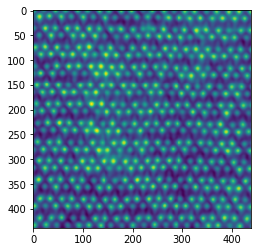

In [0]:
img = np.load('re78_cropped_image.npy')
re78 = rgb2gray(img)
plt.figure()
plt.imshow(re78)

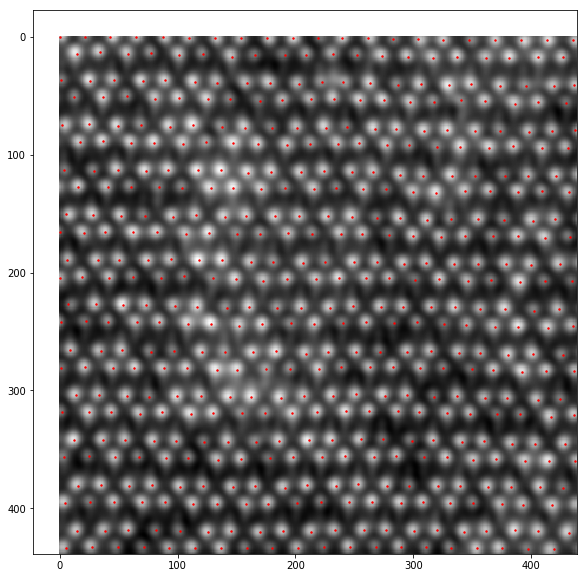

In [0]:
# Load experimental data as 2-d numpy array and load in atomic coordinates
# The AtomNet won't work on these images due to the different symmetry (something for Maxim to work on...)

atom_positions = np.load('re78_atom_positions_refined.npy')

plt.figure(figsize = (10,10))
plt.imshow(re78, cmap = 'gray')
plt.scatter(atom_positions[:,1], atom_positions[:,0], s=2, c = 'red')

# Mo<sub>0.22</sub>Re<sub>0.78</sub> Local Crystallographic Analysis

Calculating Results for Mo atom neighborhood only
Calculating Results for Re atom neighborhood only


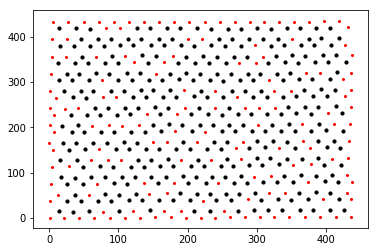

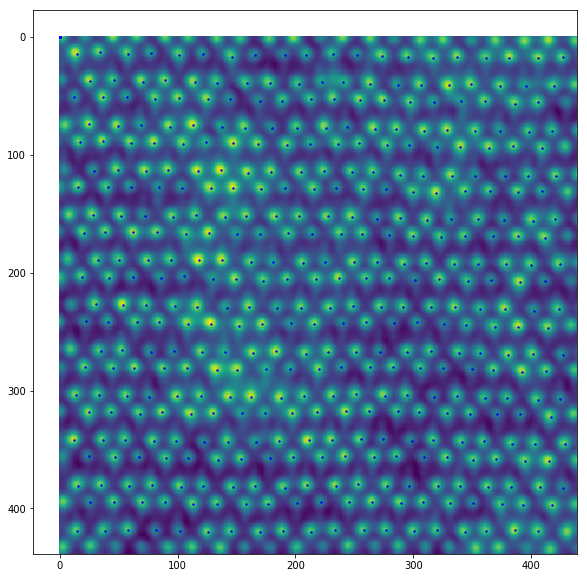

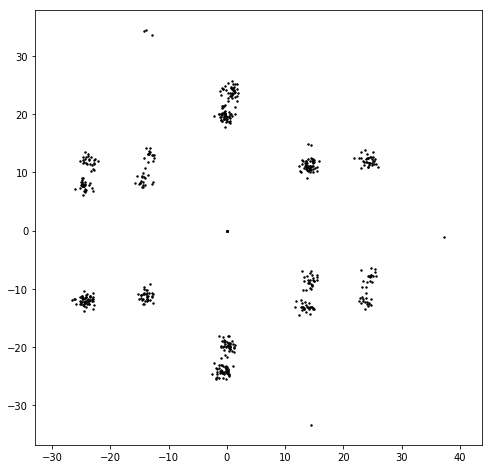

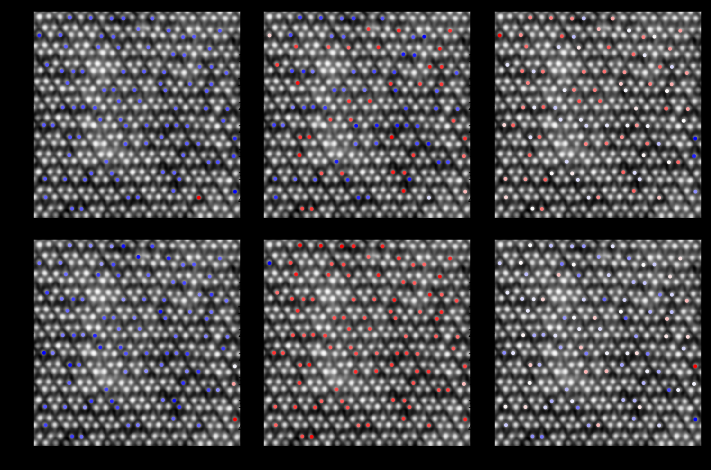

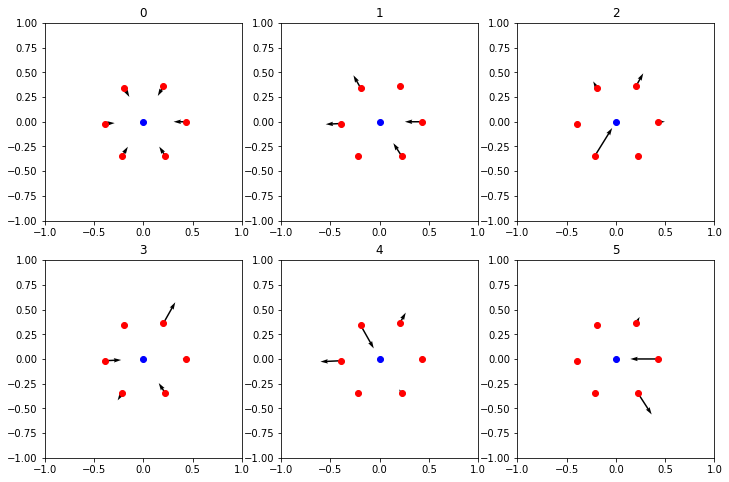

...

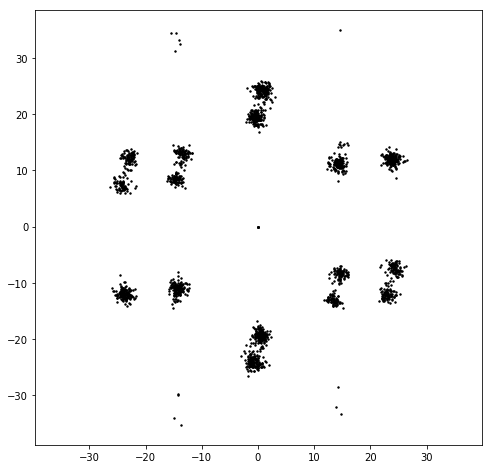

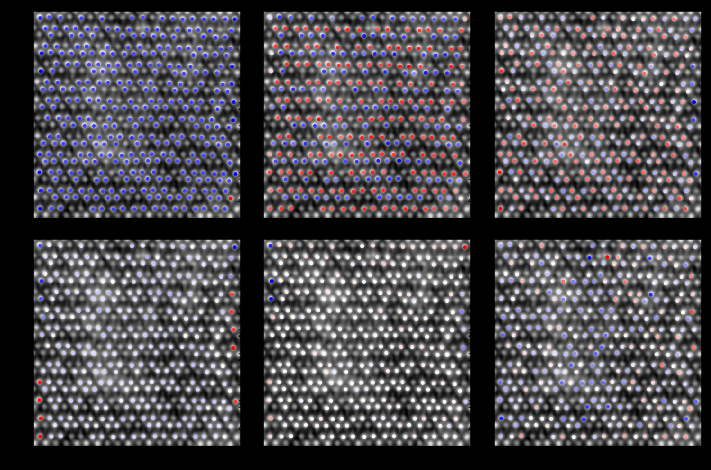

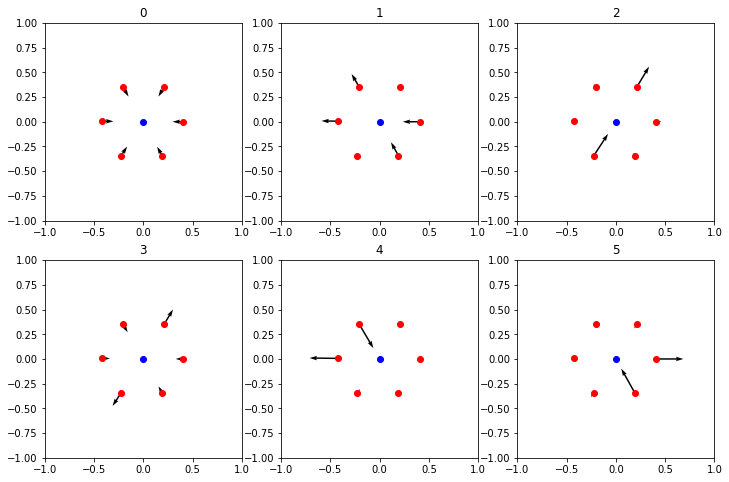

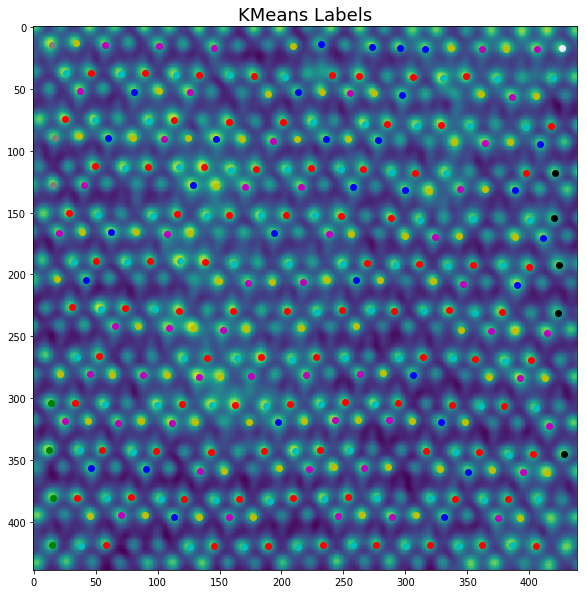

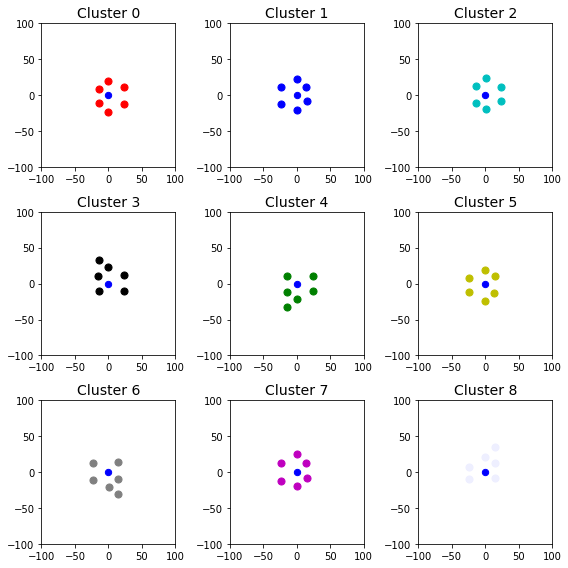

In [0]:
#TODO: Adjust helper_funcs so the plots have appropriate axes, titles, etc.

border = 10 #border pixels
num_neighbors = 6 #number of NN to analyze
num_clusters = 9
threshold_val = 0.60

cropped_image = (re78 - np.min(re78)) / (np.max(re78) - np.min(re78))

raw_image = cropped_image

image_size_x = raw_image.shape[0]
image_size_y = raw_image.shape[1]

#atom_positions = np.vstack((atom_centroids_1, atom_centroids_2))

# Edge Atom Eliminator for k-means algorithm 
x_y_positions_edge_cut = edge_eliminator(raw_image, atom_positions, border_pixels=border)

all_x = x_y_positions_edge_cut[:,0]
all_y = x_y_positions_edge_cut[:,1]

nbrs = NearestNeighbors(n_neighbors=num_neighbors+1, algorithm='brute').fit(atom_positions)
distance_vec, full_index = nbrs.kneighbors(atom_positions)

nn_index = full_index[:,1:]

# rename for convenience
atom_pos_cen = x_y_positions_edge_cut;
atom_pos_all = atom_positions;
        
Mo_atoms, Mo_atom_id, dopant_atoms, dopant_atom_id = \
threshold_and_border_correction(atom_pos_all, border_pixels=border,
                                threshold_val = threshold_val, cropped_image=cropped_image);

Re78 = {'Image': re78, 'Mo_atoms': Mo_atoms, 'Re_atoms': dopant_atoms }

plt.figure(10, figsize = (10,10))
plt.imshow(raw_image)
for i in range(atom_pos_all.shape[0]):
    re_x = atom_pos_cen[i,0]
    re_y = atom_pos_cen[i,1]
    plt.scatter(re_y, re_x, s=2, c = 'b')

choices = ['Mo', 'Re']

local_cryst_results={}

for choice in choices:

    if choice=='Mo':
        dopant_atoms2 = Mo_atoms.copy()
        dopant_atoms2_id = Mo_atom_id.copy()
        print('Calculating Results for Mo atom neighborhood only')
    else:
        print('Calculating Results for Re atom neighborhood only')
        dopant_atoms2 = dopant_atoms.copy()
        dopant_atoms2_id = dopant_atom_id.copy()

    d_mat, a_mat, xd_mat, yd_mat, atom_neighbor_pos = do_NN_analysis_ind(atom_pos_all,
                                                                         dopant_atoms2, dopant_atoms2_id, nn_index, num_neighbors=num_neighbors)

    nn_type = return_neighbor_type(atom_neighbor_pos, atom_pos_all, Mo_atom_id, dopant_atom_id)
      
    # plot neighborhood point cloud and perform PCA
    do_plot_pca_results(d_mat, a_mat, xd_mat, yd_mat, raw_image, dopant_atoms2, border =0)
    
    #do kmeans of point clouds
    do_plot_kmeans_results(xd_mat, yd_mat, dopant_atoms2, cropped_image, num_clusters = num_clusters)
    
    local_cryst_results[choice] = [d_mat, a_mat, xd_mat, yd_mat, dopant_atoms2, nn_type]
    
Re78['local_crystallography'] = local_cryst_results


In [0]:
#Just check the ratios to make sure the threshold was set correctly

len(Mo_atoms) / (len(Mo_atoms) + len(dopant_atoms))

0.2132701421800948

In [0]:
#Now let's save those into a dictionary of image + coordinates
MoReDict['Re78']=Re78


# Mo<sub>0.05</sub>Re<sub>0.95</sub> Atomic Coordinate Extraction

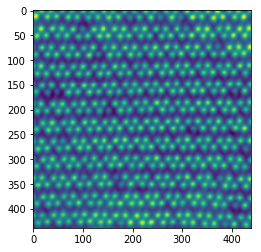

In [0]:
img = np.load('re95_cropped_image.npy')
re95 = rgb2gray(img)
plt.figure()
plt.imshow(re95)

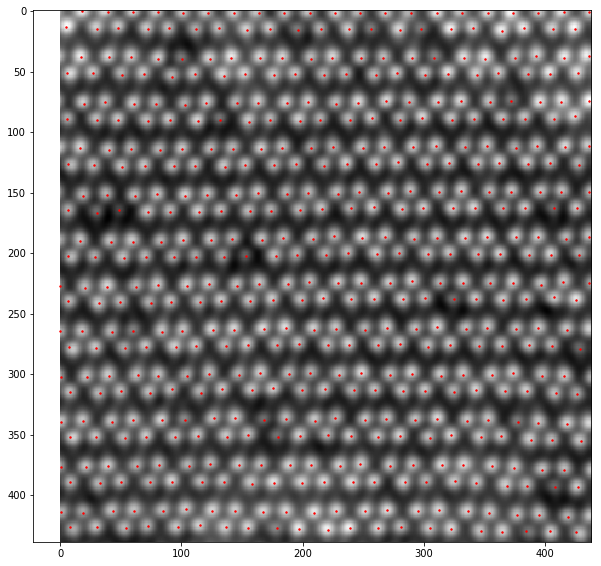

In [0]:
# Load experimental data as 2-d numpy array and load in atomic coordinates
# The AtomNet won't work on these images due to the different symmetry (something for Maxim to work on...)

atom_positions = np.load('re95_atom_positions_refined.npy')

plt.figure(figsize = (10,10))
plt.imshow(re95, cmap = 'gray')
plt.scatter(atom_positions[:,1], atom_positions[:,0], s=2, c = 'red')

# Mo<sub>0.05</sub>Re<sub>0.95</sub> Local Crystallographic Analysis

Calculating Results for Mo atom neighborhood only
Calculating Results for Re atom neighborhood only


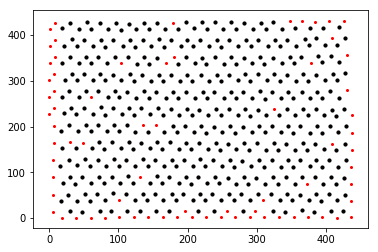

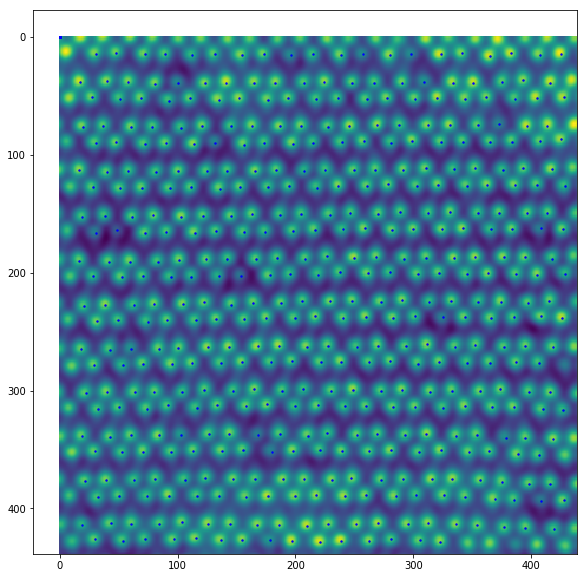

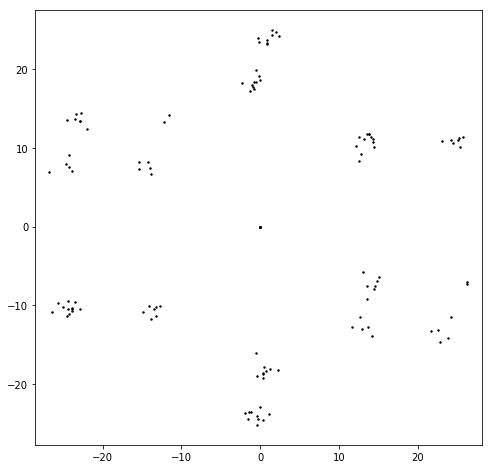

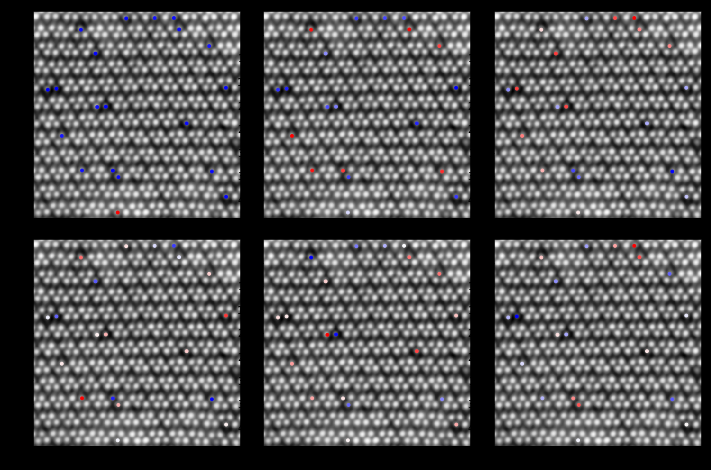

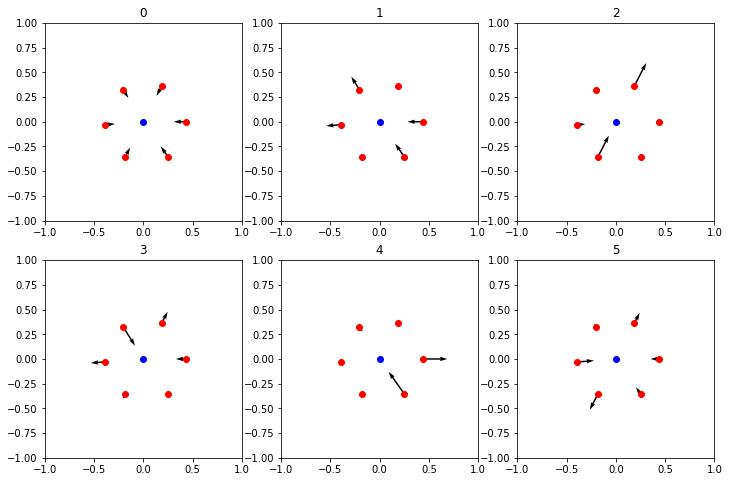

...

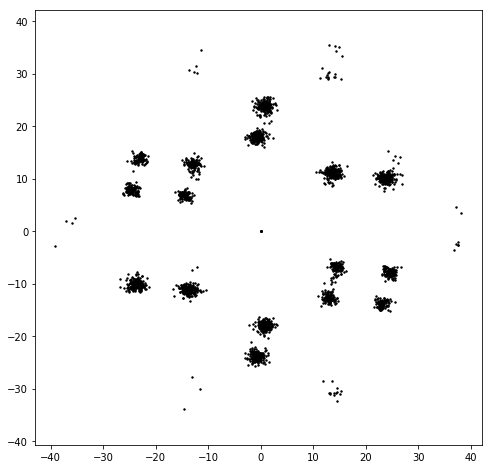

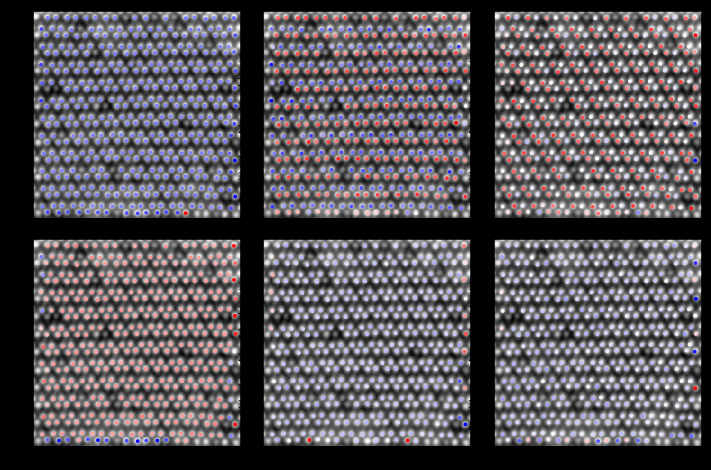

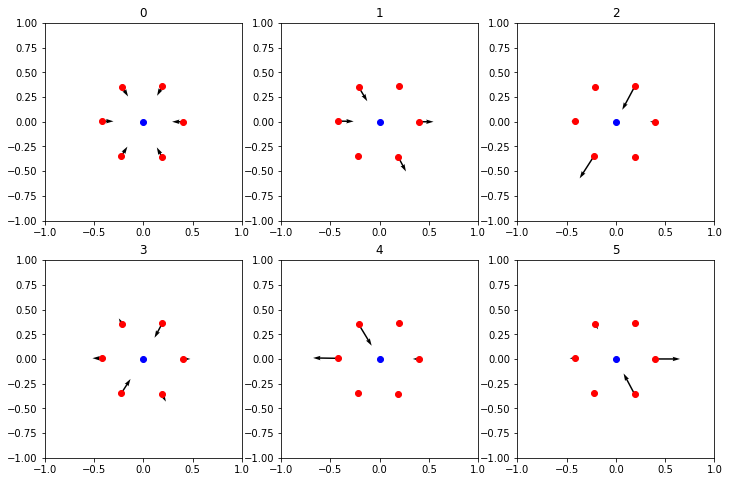

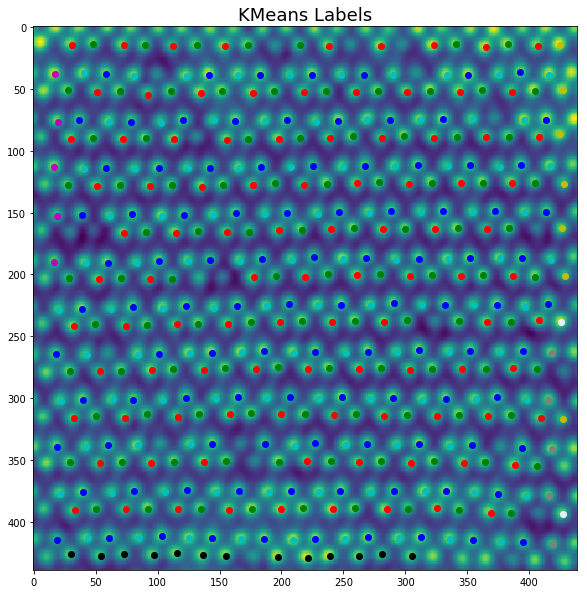

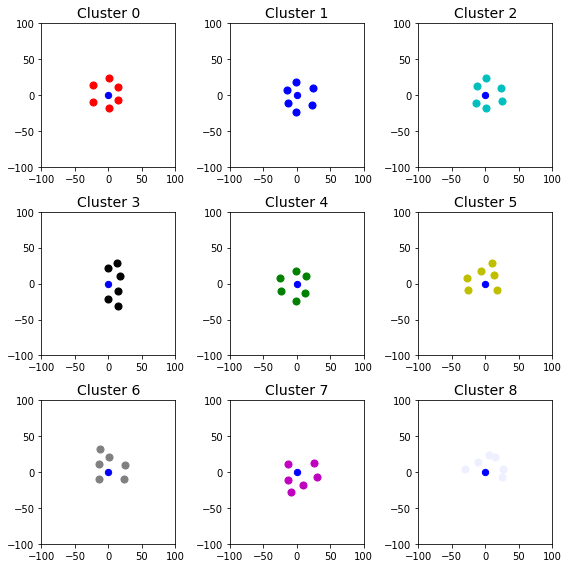

In [0]:
#TODO: Adjust helper_funcs so the plots have appropriate axes, titles, etc.

border = 10 #border pixels
num_neighbors = 6 #number of NN to analyze
num_clusters = 9
threshold_val = 0.60

cropped_image = (re95 - np.min(re95)) / (np.max(re95) - np.min(re95))

raw_image = cropped_image

image_size_x = raw_image.shape[0]
image_size_y = raw_image.shape[1]

#atom_positions = np.vstack((atom_centroids_1, atom_centroids_2))

# Edge Atom Eliminator for k-means algorithm 
x_y_positions_edge_cut = edge_eliminator(raw_image, atom_positions, border_pixels=border)

all_x = x_y_positions_edge_cut[:,0]
all_y = x_y_positions_edge_cut[:,1]

nbrs = NearestNeighbors(n_neighbors=num_neighbors+1, algorithm='brute').fit(atom_positions)
distance_vec, full_index = nbrs.kneighbors(atom_positions)

nn_index = full_index[:,1:]

# rename for convenience
atom_pos_cen = x_y_positions_edge_cut;
atom_pos_all = atom_positions;
        
Mo_atoms, Mo_atom_id, dopant_atoms, dopant_atom_id = \
threshold_and_border_correction(atom_pos_all, border_pixels=border,
                                threshold_val = threshold_val, cropped_image=cropped_image);

Re95 = {'Image': re95, 'Mo_atoms': Mo_atoms, 'Re_atoms': dopant_atoms }

plt.figure(10, figsize = (10,10))
plt.imshow(raw_image)
for i in range(atom_pos_all.shape[0]):
    re_x = atom_pos_cen[i,0]
    re_y = atom_pos_cen[i,1]
    plt.scatter(re_y, re_x, s=2, c = 'b')

choices = ['Mo', 'Re']

local_cryst_results = {}

for choice in choices:

    if choice=='Mo':
        dopant_atoms2 = Mo_atoms.copy()
        dopant_atoms2_id = Mo_atom_id.copy()
        print('Calculating Results for Mo atom neighborhood only')
    else:
        print('Calculating Results for Re atom neighborhood only')
        dopant_atoms2 = dopant_atoms.copy()
        dopant_atoms2_id = dopant_atom_id.copy()

    d_mat, a_mat, xd_mat, yd_mat, atom_neighbor_pos = do_NN_analysis_ind(atom_pos_all,
                                                                         dopant_atoms2, dopant_atoms2_id, nn_index, num_neighbors=num_neighbors)

    nn_type = return_neighbor_type(atom_neighbor_pos, atom_pos_all, Mo_atom_id, dopant_atom_id)

    # plot neighborhood point cloud and perform PCA
    do_plot_pca_results(d_mat, a_mat, xd_mat, yd_mat, raw_image, dopant_atoms2, border =0)
    
    #do kmeans of point clouds
    do_plot_kmeans_results(xd_mat, yd_mat, dopant_atoms2, cropped_image, num_clusters = num_clusters)
    
    
    local_cryst_results[choice] = [d_mat, a_mat, xd_mat, yd_mat, dopant_atoms2, nn_type]
    
Re95['local_crystallography'] = local_cryst_results


In [0]:
#Just check the ratios to make sure the threshold was set correctly

len(Mo_atoms) / (len(Mo_atoms) + len(dopant_atoms))

0.04415011037527594

In [0]:
#Now let's save those into the dictionary

MoReDict['Re95']=Re95

# Combined analytics: Do PCA

Let's look at the data all at once across compositions and do some PCA

In [0]:
#Combine all the neighborhood details
#[d_mat2, a_mat2, xd_mat2, yd_mat2, dopant_atoms2]
d_mat_Mo_all = np.vstack((MoReDict['Re05']['local_crystallography']['Mo'][0],
                          MoReDict['Re55']['local_crystallography']['Mo'][0],
                          MoReDict['Re78']['local_crystallography']['Mo'][0],
                          MoReDict['Re95']['local_crystallography']['Mo'][0]))

a_mat_Mo_all = np.vstack((MoReDict['Re05']['local_crystallography']['Mo'][1],
                          MoReDict['Re55']['local_crystallography']['Mo'][1],
                          MoReDict['Re78']['local_crystallography']['Mo'][1],
                          MoReDict['Re95']['local_crystallography']['Mo'][1]))
                          
xd_mat_Mo_all = np.vstack((MoReDict['Re05']['local_crystallography']['Mo'][2],
                          MoReDict['Re55']['local_crystallography']['Mo'][2],
                          MoReDict['Re78']['local_crystallography']['Mo'][2],
                          MoReDict['Re95']['local_crystallography']['Mo'][2]))

yd_mat_Mo_all = np.vstack((MoReDict['Re05']['local_crystallography']['Mo'][3],
                          MoReDict['Re55']['local_crystallography']['Mo'][3],
                          MoReDict['Re78']['local_crystallography']['Mo'][3],
                          MoReDict['Re95']['local_crystallography']['Mo'][3]))

dopant_atoms_Mo_all = np.vstack((MoReDict['Re05']['local_crystallography']['Mo'][4],
                          MoReDict['Re55']['local_crystallography']['Mo'][4],
                          MoReDict['Re78']['local_crystallography']['Mo'][4],
                          MoReDict['Re95']['local_crystallography']['Mo'][4]))

d_mat_Re_all = np.vstack((MoReDict['Re05']['local_crystallography']['Re'][0],
                          MoReDict['Re55']['local_crystallography']['Re'][0],
                          MoReDict['Re78']['local_crystallography']['Re'][0],
                          MoReDict['Re95']['local_crystallography']['Re'][0]))

a_mat_Re_all = np.vstack((MoReDict['Re05']['local_crystallography']['Re'][1],
                          MoReDict['Re55']['local_crystallography']['Re'][1],
                          MoReDict['Re78']['local_crystallography']['Re'][1],
                          MoReDict['Re95']['local_crystallography']['Re'][1]))
                          
xd_mat_Re_all = np.vstack((MoReDict['Re05']['local_crystallography']['Re'][2],
                          MoReDict['Re55']['local_crystallography']['Re'][2],
                          MoReDict['Re78']['local_crystallography']['Re'][2],
                          MoReDict['Re95']['local_crystallography']['Re'][2]))

yd_mat_Re_all = np.vstack((MoReDict['Re05']['local_crystallography']['Re'][3],
                          MoReDict['Re55']['local_crystallography']['Re'][3],
                          MoReDict['Re78']['local_crystallography']['Re'][3],
                          MoReDict['Re95']['local_crystallography']['Re'][3]))

dopant_atoms_Re_all = np.vstack((MoReDict['Re05']['local_crystallography']['Re'][4],
                          MoReDict['Re55']['local_crystallography']['Re'][4],
                          MoReDict['Re78']['local_crystallography']['Re'][4],
                          MoReDict['Re95']['local_crystallography']['Re'][4]))


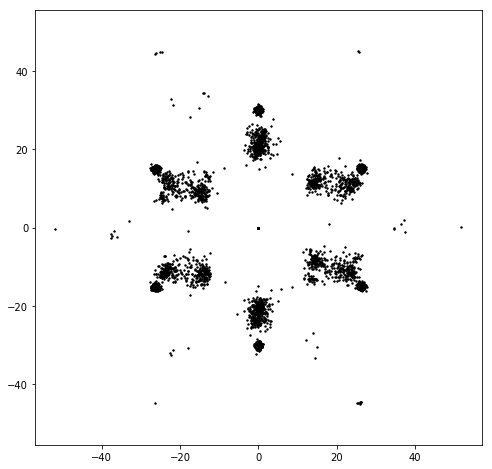

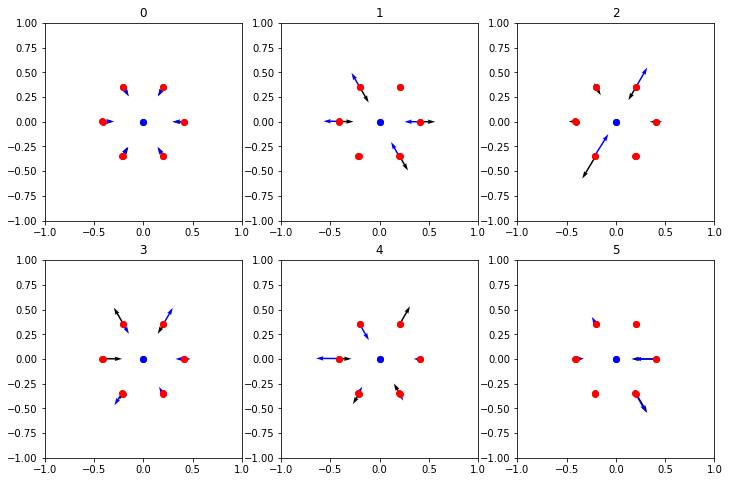

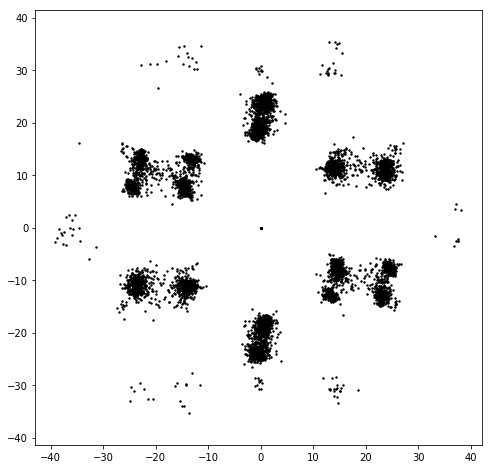

In [0]:
#Do some pca
plt.figure(figsize=(8,8))
plt.scatter(xd_mat_Mo_all,yd_mat_Mo_all,c='k',s=2)
plt.axis('equal')

all_eigenvals = []

[ud,sd,vd] = np.linalg.svd(d_mat_Mo_all,full_matrices=0) #SVD on radial distance of nearest neighbors
[ua,sa,va] = np.linalg.svd(a_mat_Mo_all,full_matrices=0) #SVD on anglular displacement of nearest neighbors

[us,ss,vs] = np.linalg.svd(xd_mat_Mo_all+1j*yd_mat_Mo_all,full_matrices=0) #SVD on relative position of nearest neighbors (complex valued)

#convert complex results of 
usm = np.abs(us)
usa = np.angle(us)
usx = np.real(us)
usy = np.imag(us)

vsm = np.abs(vs)
vsa = np.angle(vs)
vsx = np.real(vs)
vsy = np.imag(vs)

all_eigenvals.append(ud)

"""# plot eigenvalue radial displacements
fig, axs = plt.subplots(2,3, figsize=(12, 8), facecolor='black', edgecolor='w')
fig.subplots_adjust(hspace = .1, wspace=.1)
axs = axs.ravel()
for k1 in range(0,min(6,ud.shape[-1])):
    up = ud[:,k1]
    up = up-up.min()
    up = up/up.max()
    colors = plt.cm.bwr(up)
    axs[k1].imshow(1-raw_image, cmap='Greys', interpolation='none',alpha=1)
    axs[k1].scatter(atom_pos_2[:,1]+border,atom_pos_2[:,0]+border,c=colors,s=8)"""

# plot eigenvector maps of radial displacement eigenvectors
fig, axs = plt.subplots(2,3, figsize=(12, 8))
fig.subplots_adjust(hspace = .2, wspace=.2)
axs = axs.ravel()
for k1 in range(0,min(6,vd.shape[0])):
    axs[k1].plot(0,0,'bo')
    axs[k1].plot(vsx[0,:],vsy[0,:],'ro')
    #axs[k1].axis('off')    
    axs[k1].axis('equal')
    c = 1.0
    axs[k1].axis([-c, c, -c, c])
    axs[k1].set_title(str(k1))
    axs[k1].quiver(vsx[0,:],vsy[0,:],vsx[0,:]*vd[k1,:],vsy[0,:]*vd[k1,:])
    
#Now redo for Re

plt.figure(figsize=(8,8))
plt.scatter(xd_mat_Re_all,yd_mat_Re_all,c='k',s=2)
plt.axis('equal')

[ud,sd,vd] = np.linalg.svd(d_mat_Re_all,full_matrices=0) #SVD on radial distance of nearest neighbors
[ua,sa,va] = np.linalg.svd(a_mat_Re_all,full_matrices=0) #SVD on anglular displacement of nearest neighbors

[us,ss,vs] = np.linalg.svd(xd_mat_Re_all+1j*yd_mat_Re_all,full_matrices=0) #SVD on relative position of nearest neighbors (complex valued)

#convert complex results of 
usm = np.abs(us)
usa = np.angle(us)
usx = np.real(us)
usy = np.imag(us)

vsm = np.abs(vs)
vsa = np.angle(vs)
vsx = np.real(vs)
vsy = np.imag(vs)

"""# plot eigenvalue radial displacements
fig, axs = plt.subplots(2,3, figsize=(12, 8), facecolor='black', edgecolor='w')
fig.subplots_adjust(hspace = .1, wspace=.1)
axs = axs.ravel()
for k1 in range(0,min(6,ud.shape[-1])):
    up = ud[:,k1]
    up = up-up.min()
    up = up/up.max()
    colors = plt.cm.bwr(up)
    axs[k1].imshow(1-raw_image, cmap='Greys', interpolation='none',alpha=1)
    axs[k1].scatter(atom_pos_2[:,1]+border,atom_pos_2[:,0]+border,c=colors,s=8)"""

# plot eigenvector maps of radial displacement eigenvectors
#fig, axs = plt.subplots(2,3, figsize=(12, 8))
#fig.subplots_adjust(hspace = .2, wspace=.2)
#axs = axs.ravel()
for k1 in range(0,min(6,vd.shape[0])):
    axs[k1].plot(0,0,'bo')
    axs[k1].plot(vsx[0,:],vsy[0,:],'ro')
    #axs[k1].axis('off')    
    axs[k1].axis('equal')
    c = 1.0
    axs[k1].axis([-c, c, -c, c])
    axs[k1].set_title(str(k1))
    axs[k1].quiver(vsx[0,:],vsy[0,:],vsx[0,:]*vd[k1,:],vsy[0,:]*vd[k1,:], color = 'b')

all_eigenvals.append(ud)

In [0]:
#584,215,90,20 these numbers come from MoReDict['Re95']['local_crystallography']['Mo'][0].shape etc.
a_Mo = MoReDict['Re05']['local_crystallography']['Mo'][0].shape[0]
b_Mo = MoReDict['Re55']['local_crystallography']['Mo'][0].shape[0]
c_Mo = MoReDict['Re78']['local_crystallography']['Mo'][0].shape[0]

ud_Mo = all_eigenvals[0]
ud_Mo_reshaped =[ud_Mo[:a_Mo, :], ud_Mo[a_Mo:a_Mo+b_Mo,:], ud_Mo[a_Mo+b_Mo:a_Mo+b_Mo+c_Mo], ud_Mo[a_Mo+b_Mo+c_Mo:,:]]

a_Re = MoReDict['Re05']['local_crystallography']['Re'][0].shape[0]
b_Re = MoReDict['Re55']['local_crystallography']['Re'][0].shape[0]
c_Re = MoReDict['Re78']['local_crystallography']['Re'][0].shape[0]

ud_Re = all_eigenvals[1]
ud_Re_reshaped =[ud_Re[:a_Re, :], ud_Re[a_Re:a_Re+b_Re,:], ud_Re[a_Re+b_Re:a_Re+b_Re+c_Re], ud_Re[a_Re+b_Re+c_Re:,:]]

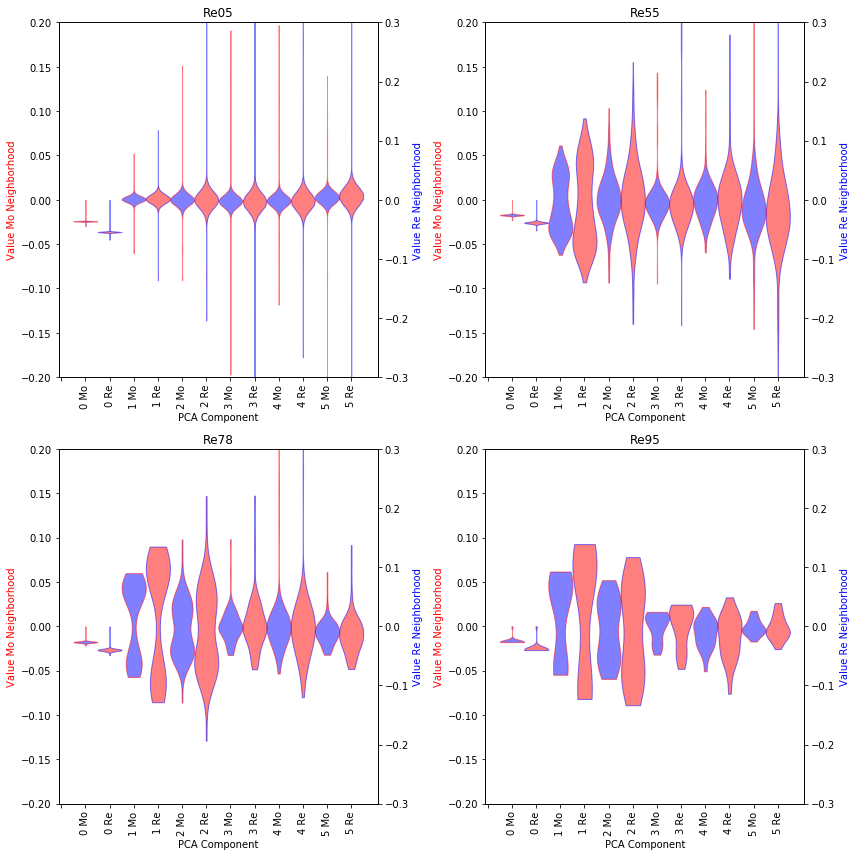

In [0]:
#plot a series of violin plots for the six components
titles = ['Re05', 'Re55', 'Re78', 'Re95']

fig, axes = plt.subplots(nrows=2,ncols=2, figsize = (12,12))
for ind, ax in enumerate(axes.flat):
  violin_parts = ax.violinplot(ud_Mo_reshaped[ind], showextrema=False)
  ax2 = ax.twinx()
  ax.set_xlabel('PCA Component')
  ax.set_xticks([0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5, 5.5, 6])
  ax.set_xticklabels(['', '0 Mo', '0 Re','1 Mo', '1 Re','2 Mo', '2 Re','3 Mo', '3 Re','4 Mo', '4 Re','5 Mo', '5 Re'], rotation = 90)
  
  ax.set_title(titles[ind])
  ax.set_ylabel('Value Mo Neighborhood', color= 'red')
  ax.set_ylim([-0.2, 0.2])
  
  # Make the violin body red with a blue border:
  for vp in violin_parts['bodies']:
      vp.set_facecolor('red')
      vp.set_edgecolor('blue')
      vp.set_linewidth(1)
      vp.set_alpha(0.5)
  
  violin_parts = ax2.violinplot( ud_Mo_reshaped[ind], positions = np.arange(6)+0.5, showextrema=False)
  ax2.set_ylabel('Value Re Neighborhood', color = 'blue')
  ax2.set_ylim([-0.3, 0.3])
  # Make the violin body blue with a red border:
  for vp in violin_parts['bodies']:
      vp.set_facecolor('blue')
      vp.set_edgecolor('red')
      vp.set_linewidth(1)
      vp.set_alpha(0.5)

fig.tight_layout()

# KMeans on all atoms

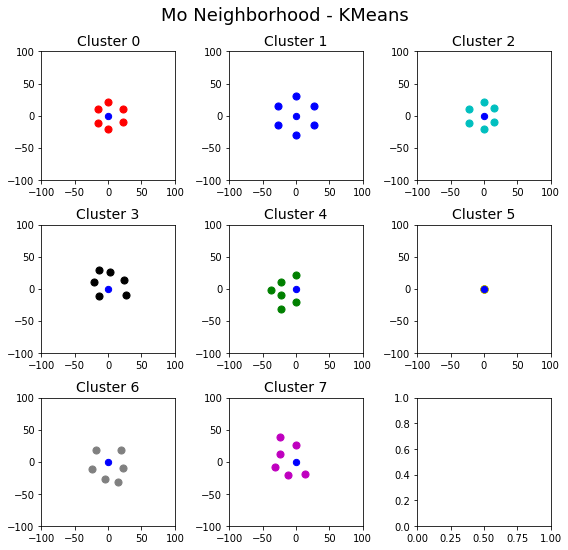

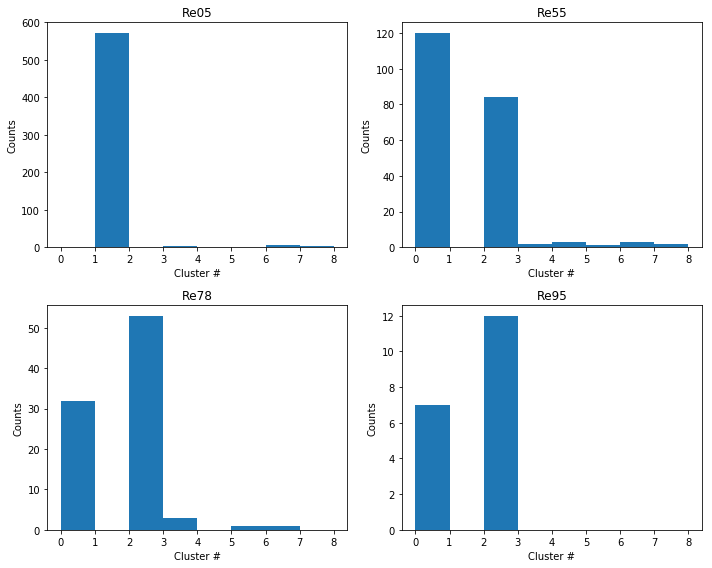

In [0]:
#Do some kmeans. 


#Here we do it for the Mo Neighborhood
num_clusters = 8

zd_mat2 = np.zeros(shape=(xd_mat_Mo_all.shape[0]-1, yd_mat_Mo_all.shape[1],2))
zd_mat2[:,:,0] = xd_mat_Mo_all[:-1,:]
zd_mat2[:,:,1] = yd_mat_Mo_all[:-1,:]
zd_mat2 = zd_mat2.reshape(xd_mat_Mo_all.shape[0]-1, -1)

km = KMeans(n_clusters = num_clusters)
km.fit(zd_mat2)
cluster_centroids = km.cluster_centers_
labels=km.labels_
labels_reshaped =[labels[:a_Mo], labels[a_Mo:a_Mo+b_Mo], labels[a_Mo+b_Mo:a_Mo+b_Mo+c_Mo], labels[a_Mo+b_Mo+c_Mo:]]

my_colors = ['r', 'b', 'c', 'k', 'g', 'y', 'gray', 'm', '#eeefff',
            '#eeefff', '#eeefff', '#eeefff', '#eeefff','#eeefff']

if num_clusters <=4:
  fig, axes = plt.subplots(nrows=2, ncols=2, figsize = (4,4))
elif num_clusters>4 and num_clusters<=6:
  fig, axes = plt.subplots(nrows=2, ncols=3, figsize = (6,4))
elif num_clusters>6:
  fig, axes = plt.subplots(nrows=3, ncols=3, figsize = (8,8))

for ind, ax in enumerate(axes.flat):
  if ind< num_clusters:
      pt = cluster_centroids[ind,:]
      xpts = pt[::2]
      ypts = pt[1::2]
      my_color = my_colors[ind]
      ax.scatter(xpts, ypts, s=50, c = my_color)
      ax.scatter(0,0,c='b', s = 40)
      #ax.axis('equal')
      ax.set_xlim(-100,100)
      ax.set_ylim(-100,100)
      #ax.set_xticklabels([-50, -25, 0, 25, 50], fontsize = 14)
      #ax.set_yticklabels([-50, -25, 0, 25, 50], fontsize = 14)
      ax.set_title('Cluster {}'.format(ind), fontsize = 14)

fig.suptitle('Mo Neighborhood - KMeans', fontsize=18)     
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

fig, axes = plt.subplots(nrows=2,ncols=2, figsize = (10,8))

comp_titles = ['Re05', 'Re55', 'Re78', 'Re95']

for ind, ax in enumerate(axes.flat):
  comp_title = comp_titles[ind]
  ax.hist(labels_reshaped[ind], bins=np.arange(0,num_clusters+1), align = 'mid')
  #ax.set_xlim(0, num_clusters)
  ax.set_title(comp_title)
  ax.set_xlabel('Cluster #')
  ax.set_ylabel('Counts')

fig.tight_layout()


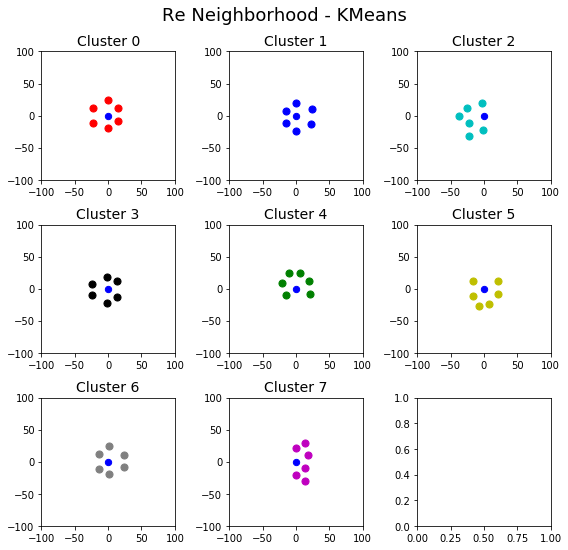

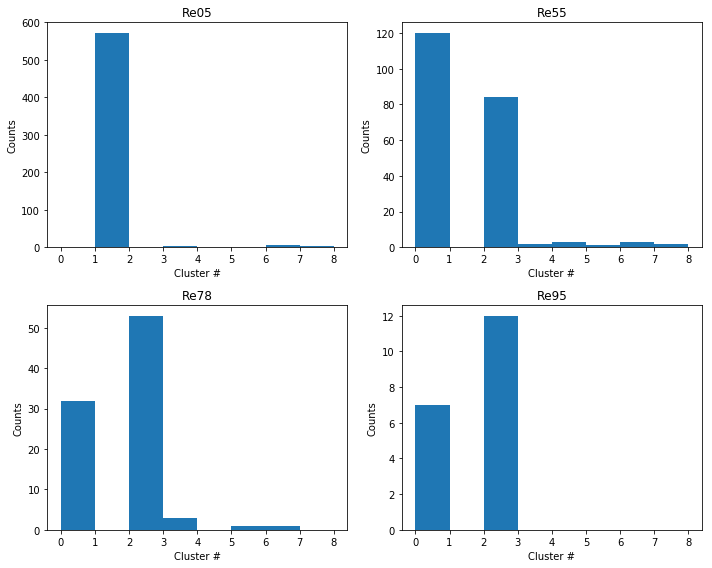

In [0]:
#Here we do it for the Re Neighborhood

num_clusters = 8

zd_mat2 = np.zeros(shape=(xd_mat_Re_all.shape[0]-1, yd_mat_Re_all.shape[1],2))
zd_mat2[:,:,0] = xd_mat_Re_all[:-1,:]
zd_mat2[:,:,1] = yd_mat_Re_all[:-1,:]
zd_mat2 = zd_mat2.reshape(xd_mat_Re_all.shape[0]-1, -1)

km = KMeans(n_clusters = num_clusters)
km.fit(zd_mat2)
cluster_centroids = km.cluster_centers_
labels=km.labels_
#print(labels.shape)
#print(cluster_centroids.shape)
my_colors = ['r', 'b', 'c', 'k', 'g', 'y', 'gray', 'm', '#eeefff',
            '#eeefff', '#eeefff', '#eeefff', '#eeefff','#eeefff']

if num_clusters <=4:
  fig, axes = plt.subplots(nrows=2, ncols=2, figsize = (4,4))
elif num_clusters>4 and num_clusters<=6:
  fig, axes = plt.subplots(nrows=2, ncols=3, figsize = (6,4))
elif num_clusters>6:
  fig, axes = plt.subplots(nrows=3, ncols=3, figsize = (8,8))

for ind, ax in enumerate(axes.flat):
  if ind< num_clusters:
      pt = cluster_centroids[ind,:]
      xpts = pt[::2]
      ypts = pt[1::2]
      my_color = my_colors[ind]
      ax.scatter(xpts, ypts, s=50, c = my_color)
      ax.scatter(0,0,c='b', s = 40)
      #ax.axis('equal')
      ax.set_xlim(-100,100)
      ax.set_ylim(-100,100)
      #ax.set_xticklabels([-50, -25, 0, 25, 50], fontsize = 14)
      #ax.set_yticklabels([-50, -25, 0, 25, 50], fontsize = 14)
      ax.set_title('Cluster {}'.format(ind), fontsize = 14)

fig.suptitle('Re Neighborhood - KMeans', fontsize=18)      
fig.tight_layout(rect=[0, 0.03, 1, 0.95])



fig2, axes2 = plt.subplots(nrows=2,ncols=2, figsize = (10,8))

for ind, ax in enumerate(axes2.flat):
  comp_title = comp_titles[ind]
  ax.hist(labels_reshaped[ind], bins=np.arange(0,num_clusters+1), align = 'mid')
  #ax.set_xlim(0, num_clusters)
  ax.set_title(comp_title)
  ax.set_xlabel('Cluster #')
  ax.set_ylabel('Counts')

fig2.tight_layout()



# Correlation analysis

In [0]:
#Let's compile the info

all_Mo_atoms = np.vstack(( MoReDict['Re05']['local_crystallography']['Mo'][-2],MoReDict['Re55']['local_crystallography']['Mo'][-2],
                         MoReDict['Re78']['local_crystallography']['Mo'][-2],MoReDict['Re95']['local_crystallography']['Mo'][-2]))

all_Re_atoms =  np.vstack(( MoReDict['Re05']['local_crystallography']['Re'][-2],MoReDict['Re55']['local_crystallography']['Re'][-2],
                         MoReDict['Re78']['local_crystallography']['Re'][-2],MoReDict['Re95']['local_crystallography']['Re'][-2]))

nn_index_Mo_all = np.vstack((MoReDict['Re05']['local_crystallography']['Mo'][-1],MoReDict['Re55']['local_crystallography']['Mo'][-1],
                            MoReDict['Re78']['local_crystallography']['Mo'][-1],MoReDict['Re95']['local_crystallography']['Mo'][-1]))

nn_index_Re_all = np.vstack((MoReDict['Re05']['local_crystallography']['Re'][-1],MoReDict['Re55']['local_crystallography']['Re'][-1],
                            MoReDict['Re78']['local_crystallography']['Re'][-1],MoReDict['Re95']['local_crystallography']['Re'][-1]))



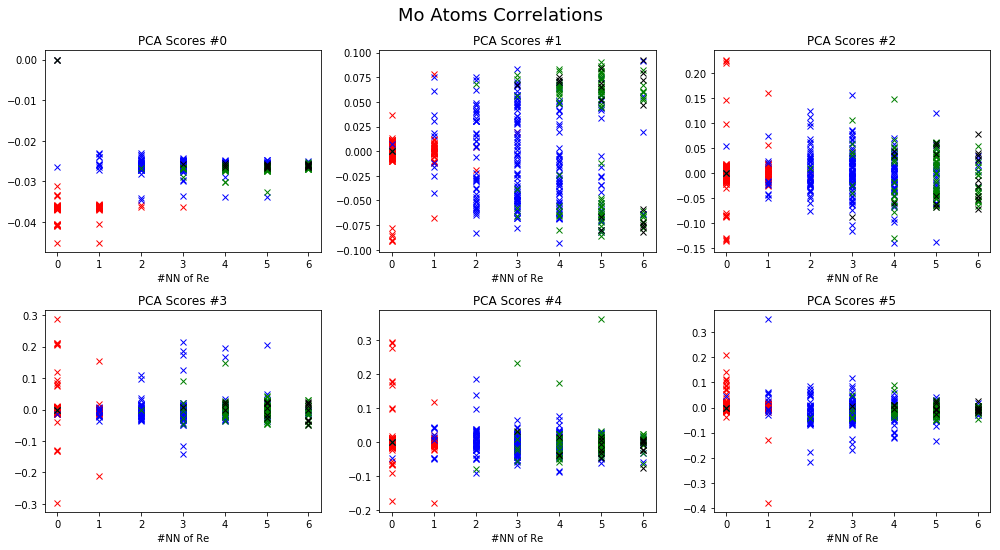

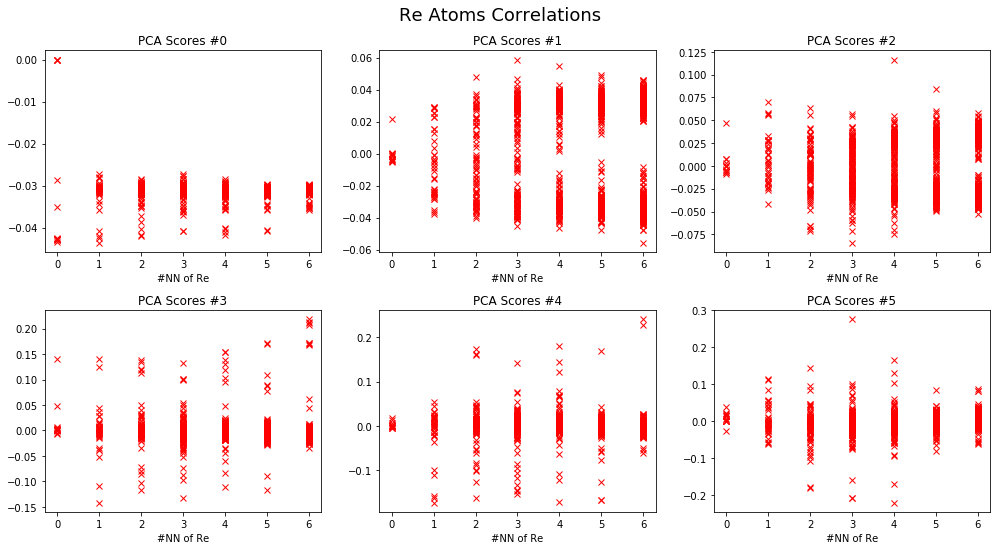

In [0]:
#Let's see how the eigenvalues can correlate against the number of NNs
#Here we take the PCA results from the MO atoms
#ANd then we plot them against the number of NN of Re, separately for each PCA component.
#Repeat for the Re

sum_nn_index_Mo_all = np.sum(nn_index_Mo_all, axis=-1)
sum_nn_index_Re_all = np.sum(nn_index_Re_all, axis=-1)

#Plot for each eigenvalue

#[ud_Mo[:a_Mo, :], ud_Mo[a_Mo:a_Mo+b_Mo,:], ud_Mo[a_Mo+b_Mo:a_Mo+b_Mo+c_Mo], ud_Mo[a_Mo+b_Mo+c_Mo:,:]]

fig, axes = plt.subplots(nrows=2,ncols=3, figsize = (14,8))
for ind, ax in enumerate(axes.flat):
  #ax.plot(sum_nn_index_Mo_all,ud_Mo[:,ind], color = color_s)
  #ud_Mo_eigenvals = ud_Mo[:,ind]
  
  ax.plot(sum_nn_index_Mo_all[:a_Mo],ud_Mo[:,ind][:a_Mo], 'rx')
  ax.plot(sum_nn_index_Mo_all[a_Mo:a_Mo+b_Mo],ud_Mo[:,ind][a_Mo:a_Mo+b_Mo], 'bx')
  ax.plot(sum_nn_index_Mo_all[a_Mo+b_Mo:a_Mo+b_Mo+c_Mo],ud_Mo[:,ind][a_Mo+b_Mo:a_Mo+b_Mo+c_Mo], 'gx')
  ax.plot(sum_nn_index_Mo_all[a_Mo+b_Mo+c_Mo:],ud_Mo[:,ind][a_Mo+b_Mo+c_Mo:], 'kx')
  
  ax.set_title('PCA Scores #' + str(ind))
  ax.set_xlabel('#NN of Re')
fig.suptitle('Mo Atoms Correlations', fontsize=18)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])


fig, axes = plt.subplots(nrows=2,ncols=3, figsize = (14,8))
for ind, ax in enumerate(axes.flat):
  ax.plot(sum_nn_index_Re_all,ud_Re[:,ind], 'rx')
  ax.set_title('PCA Scores #' + str(ind))
  ax.set_xlabel('#NN of Re')
fig.suptitle('Re Atoms Correlations', fontsize=18)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
  

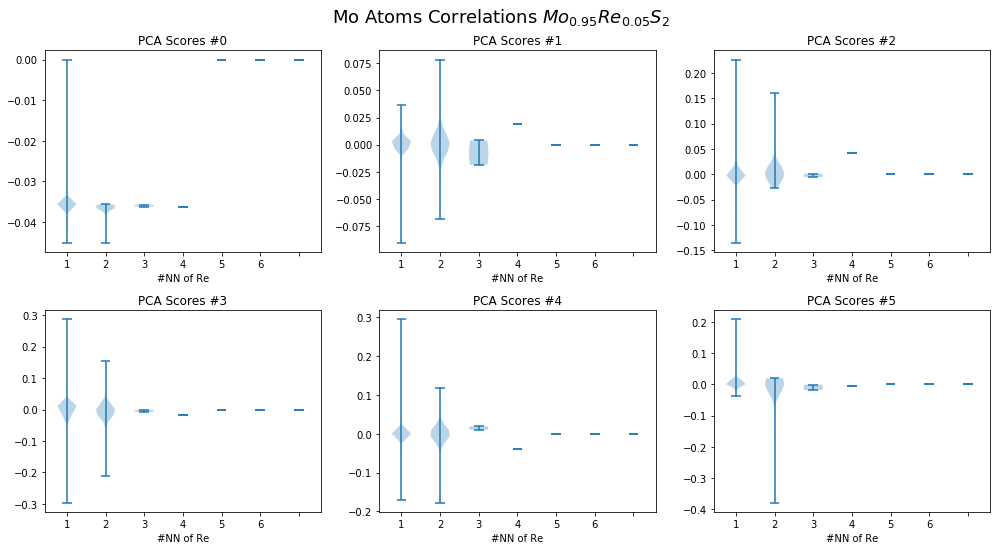

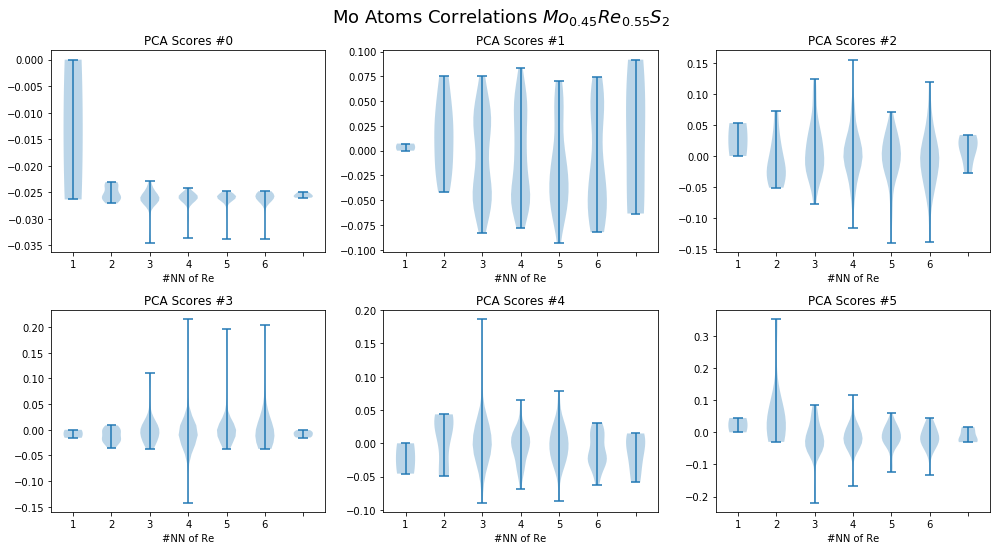

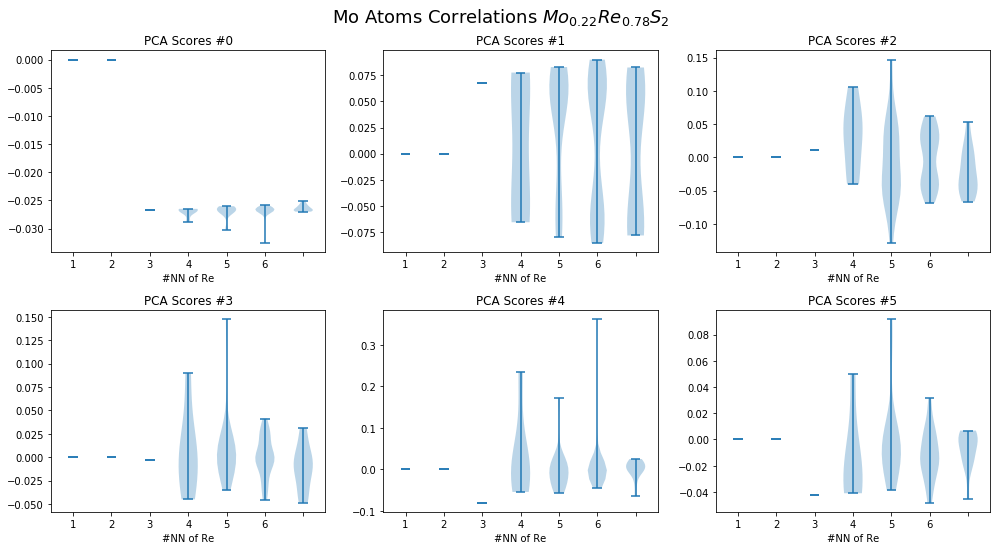

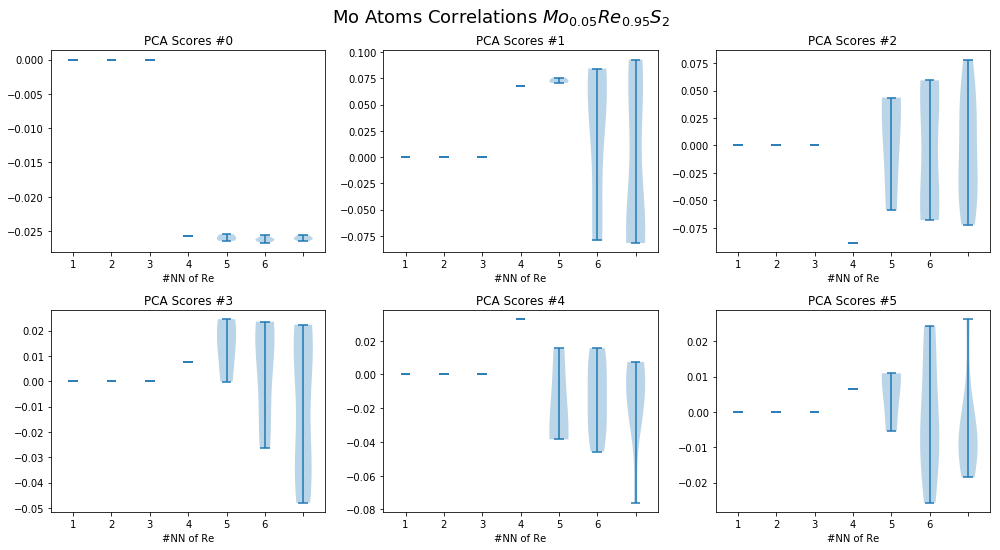

In [0]:
#Plot these separately for the compositions
#Define a convenience plotting function
def plot_violin_eigenvals(ud_Mo, sum_nn_index_Mo_all, indices, plot_title):

  fig, axes = plt.subplots(nrows=2,ncols=3, figsize = (14,8))
  for ind, ax in enumerate(axes.flat):
    ud_vals = ud_Mo[:,ind][indices[0]:indices[1]]
    nn_vals = sum_nn_index_Mo_all[indices[0]:indices[1]]
    ud_val_k = []

    for i in range(7):
      temp_val = ud_vals[np.where(nn_vals==i)[0]]
      if len(temp_val)==0: temp_val = 0
      ud_val_k.append(temp_val)

    ax.violinplot(ud_val_k, positions = np.arange(7), points = 20)
    ax.set_title('PCA Scores #' + str(ind))
    ax.set_xlabel('#NN of Re')
    #ax.set_xticks([0,1,2,3,4,5,6])
    ax.set_xticklabels(np.arange(7))
  
  fig.suptitle(plot_title, fontsize=18)
  fig.tight_layout(rect=[0, 0.03, 1, 0.95])

  return fig

fig1 = plot_violin_eigenvals(ud_Mo, sum_nn_index_Mo_all, [0, a_Mo], plot_title = 'Mo Atoms Correlations $Mo_{0.95}Re_{0.05}S_2$')
fig2 = plot_violin_eigenvals(ud_Mo, sum_nn_index_Mo_all, [a_Mo, a_Mo+b_Mo], plot_title = 'Mo Atoms Correlations $Mo_{0.45}Re_{0.55}S_2$')
fig3 = plot_violin_eigenvals(ud_Mo, sum_nn_index_Mo_all, [a_Mo+b_Mo, a_Mo+b_Mo+c_Mo], plot_title = 'Mo Atoms Correlations $Mo_{0.22}Re_{0.78}S_2$')
fig4 = plot_violin_eigenvals(ud_Mo, sum_nn_index_Mo_all, [a_Mo+b_Mo+c_Mo, len(sum_nn_index_Mo_all)], plot_title = 'Mo Atoms Correlations $Mo_{0.05}Re_{0.95}S_2$')


Let's do some Canonical Correlation analysis

We have two datasets: eigenvalues, and the chemical vector (NN of Re). Let's correlate them!



In [0]:
from sklearn.cross_decomposition import CCA

In [0]:
cca_analysis_Mo = CCA(n_components = 1)

cca_analysis_Mo.fit(ud_Mo, nn_index_Mo_all)

X_c, Y_c = cca_analysis_Mo.transform(ud_Mo, nn_index_Mo_all)
  
cca_analysis_Re = CCA(n_components = 1)

cca_analysis_Re.fit(ud_Re, nn_index_Re_all)

X_c_r, Y_c_r = cca_analysis_Re.transform(np.abs(ud_Re), nn_index_Re_all)

Text(0.5, 1.0, 'Re atoms: Correlation: -0.21')

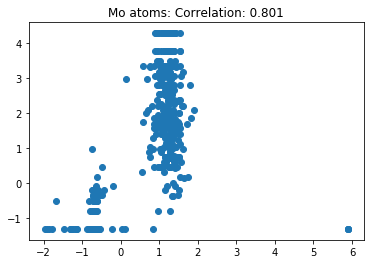

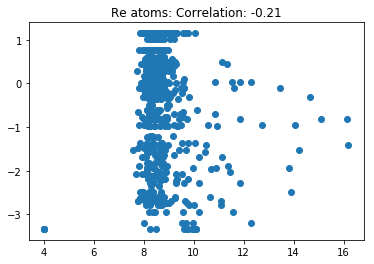

In [0]:
plt.figure()
plt.scatter(X_c, Y_c)
cc = (np.corrcoef(X_c[:,0], Y_c[:,0])[0, 1])

plt.title("Mo atoms: Correlation: {}".format(np.round(cc,3)))

plt.figure()
plt.scatter(X_c_r, Y_c_r)
cc = (np.corrcoef(X_c_r[:,0], Y_c_r[:,0])[0, 1])
plt.title("Re atoms: Correlation: {}".format(np.round(cc,3)))

In [0]:
cc = (np.corrcoef(X_c[:,0], Y_c[:,0])[0, 1])

In [0]:
np.round(cc,2)

0.8